
# Data Management - Analyse du marché de l'immobilier français

Joudy Benkaddour et Gabrielle Morin - M1 AEEF

## 1 - Importation des données

Importation des libraries nécessaires.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import date2num
import seaborn as sns
import numpy as np
import statsmodels.api as sm

Importation de toutes les bases de données.

In [2]:
data2017s2 = pd.read_csv("valeursfoncieres-2017-s2.txt", sep='|',low_memory=False)
data2018 = pd.read_csv("valeursfoncieres-2018.txt", sep='|',low_memory=False)
data2019 = pd.read_csv("valeursfoncieres-2019.txt", sep='|',low_memory=False)
data2020 = pd.read_csv("valeursfoncieres-2020.txt", sep='|',low_memory=False)
data2021 = pd.read_csv("valeursfoncieres-2021.txt", sep='|',low_memory=False)
data2022 = pd.read_csv("valeursfoncieres-2022.txt", sep='|',low_memory=False)

La fonction ci-dessous nous permet d'anaylser les fichiers importés :

In [3]:
def info_dataframe(data):
    #Statistiques descriptives
    print("Statistique descriptive:")
    print(data.describe())
    
    #Premières lignes du dataframe
    print("\n5 premières lignes du dataframe:")
    print(data.head())
    
    #Dimensions du dataframe
    print("\nDimension du dataframe:", data.shape)
    print(data2017s2.info())
    
    #Taille du fichier (en octets)
    taille = data.memory_usage().sum()/1024**2
    print(f"La taille du DataFrame est de {taille} méga-octets")

## 2 - Nettoyage des données

Nous allons concatener nos bases annuelles en une base de données globales.

Nous commencons par analyser les colonnes des bases afin de voir si elles sont identiques.

In [6]:
colonnes2017 = data2017s2.columns
colonnes2018 = data2018.columns
colonnes2019 = data2019.columns
colonnes2020 = data2020.columns
colonnes2021 = data2021.columns
colonnes2022 = data2022.columns

# Vérification si tous les DataFrames ont les mêmes colonnes
if (colonnes2017.equals(colonnes2018) and colonnes2017.equals(colonnes2019) and colonnes2017.equals(colonnes2020) and colonnes2017.equals(colonnes2021) and colonnes2017.equals(colonnes2022)):
    print("Les DataFrames ont les mêmes colonnes.")
else:
    print("Les DataFrames ont des colonnes différentes.")

Les DataFrames ont des colonnes différentes.


Nous pouvons voir q'une colonne change de nom en 2022. Cependant, selon la notice descriptive du fichier de données, les colonens *Code services sages* et *Identifiant de document* contiennent les mêmes informations. Nous renommons donc la colonne de 2022.

In [7]:
data2022 = data2022.rename(columns={'Identifiant de document':'Code service sages'})

Comme les colonnes des dataframes son identiques, nous pouvons assembler les bases facilement en les concaténant.

Ce résultat facilite nos travaux car nous effectuerons nos modifications uniquement sur la base de 2017 puis nous les généraliserons sur l'ensemble des base de donnée grâce à une fonction.

### Retraitement de la base 2017

In [8]:
# Affichage des 5 premières lignes du DataFrame résultant
data2017s2.head()

,Code service sages,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,...,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,04/07/2017,Vente,...,NaN,0,1.0,Maison,NaN,73.0,4.0,S,NaN,391.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,06/07/2017,Vente,...,NaN,1,3.0,Dépendance,NaN,0.0,0.0,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,06/07/2017,Vente,...,NaN,1,2.0,Appartement,NaN,32.0,1.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,07/07/2017,Vente terrain à bâtir,...,NaN,0,NaN,NaN,NaN,NaN,NaN,AB,NaN,605.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,06/07/2017,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,AG,NaN,259.0


Nous allons maintenant retraiter certaines colonnes du dataframe.

Nous  identifions d'abord les colonnes ne contenant aucune données, en regardant les valeurs uniques:

In [ ]:
# Obtention des valeurs uniques de toutes les colonnes
for colonne in data2017s2.columns:
    valeurs_uniques = data2017s2[colonne].unique()
    print(f"Les valeurs uniques de la colonne {colonne} sont: {valeurs_uniques}")

Nous supprimons les colonnes vides.

In [ ]:
# Obtention du nombre de valeurs uniques de chaque colonne
valeurs_uniques_par_colonne = data2017s2.nunique()
print(valeurs_uniques_par_colonne)

In [11]:
# Filtrage des colonnes qui ont un seul nombre de valeur unique
colonnes_a_supprimer = valeurs_uniques_par_colonne[valeurs_uniques_par_colonne == 0].index.tolist()
colonnes_a_supprimer

['Code service sages',
 'Reference document',
 '1 Articles CGI',
 '2 Articles CGI',
 '3 Articles CGI',
 '4 Articles CGI',
 '5 Articles CGI',
 'Identifiant local']

In [12]:
# Suppression des colonnes du DataFrame
data2017s2 = data2017s2.drop(colonnes_a_supprimer, axis=1)

In [13]:
data2017s2.head()

,No disposition,Date mutation,Nature mutation,Valeur fonciere,No voie,B/T/Q,Type de voie,Code voie,Voie,Code postal,...,5eme lot,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,1,04/07/2017,Vente,"166100,00",843.0,NaN,RUE,0100,DE LA CHARPINE,1000.0,...,NaN,NaN,0,1.0,Maison,73.0,4.0,S,NaN,391.0
1,1,06/07/2017,Vente,"59000,00",2.0,NaN,RUE,1720,GOUNOD,1000.0,...,NaN,NaN,1,3.0,Dépendance,0.0,0.0,NaN,NaN,NaN
2,1,06/07/2017,Vente,"59000,00",2.0,NaN,RUE,1720,GOUNOD,1000.0,...,NaN,NaN,1,2.0,Appartement,32.0,1.0,NaN,NaN,NaN
3,1,07/07/2017,Vente terrain à bâtir,"55000,00",NaN,NaN,NaN,B033,LA MAGDELEINE,1160.0,...,NaN,NaN,0,NaN,NaN,NaN,NaN,AB,NaN,605.0
4,1,06/07/2017,Vente,"130000,00",NaN,NaN,NaN,B148,HAMEAU DU CREUX EST,1750.0,...,NaN,NaN,0,NaN,NaN,NaN,NaN,AG,NaN,259.0


Après une analyse préliminaire des colonnes. Nous acons fait le choix d'en supprimer certaines qui ne sont pas pertinentes dans notre étude de données.

In [14]:
colonnes_a_supprimer_2 = ["No disposition","No voie","B/T/Q","Type de voie","Code voie","Voie","Code commune","Prefixe de section","Section","No plan","No Volume","1er lot","Surface Carrez du 1er lot","2eme lot","Surface Carrez du 2eme lot","3eme lot","Surface Carrez du 3eme lot","4eme lot","Surface Carrez du 4eme lot","5eme lot","Surface Carrez du 5eme lot","Nombre de lots","Code type local","Nature culture","Nature culture speciale"]
data2017s2 = data2017s2.drop(colonnes_a_supprimer_2, axis=1)

In [15]:
data2017s2.head()

,Date mutation,Nature mutation,Valeur fonciere,Code postal,Commune,Code departement,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
0,04/07/2017,Vente,"166100,00",1000.0,SAINT-DENIS-LES-BOURG,01,Maison,73.0,4.0,391.0
1,06/07/2017,Vente,"59000,00",1000.0,BOURG-EN-BRESSE,01,Dépendance,0.0,0.0,NaN
2,06/07/2017,Vente,"59000,00",1000.0,BOURG-EN-BRESSE,01,Appartement,32.0,1.0,NaN
3,07/07/2017,Vente terrain à bâtir,"55000,00",1160.0,VARAMBON,01,NaN,NaN,NaN,605.0
4,06/07/2017,Vente,"130000,00",1750.0,REPLONGES,01,NaN,NaN,NaN,259.0


### Généralisation aux autres bases de données

In [16]:
def NettoyageBase(df):
        
    # Suppression des colonnes vides
    colonnes_a_supprimer = df.nunique()[df.nunique() == 0].index.tolist()
    df = df.drop(colonnes_a_supprimer, axis=1)

     # Suppression des colonnes non-pertinentes
    colonnes_a_supprimer_2 = ["No disposition","No voie","B/T/Q","Type de voie","Code voie","Voie","Code commune","Prefixe de section","Section","No plan","No Volume","1er lot","Surface Carrez du 1er lot","2eme lot","Surface Carrez du 2eme lot","3eme lot","Surface Carrez du 3eme lot","4eme lot","Surface Carrez du 4eme lot","5eme lot","Surface Carrez du 5eme lot","Nombre de lots","Code type local","Nature culture","Nature culture speciale"]
    df = df.drop(colonnes_a_supprimer_2, axis=1)
    
    return df

In [ ]:
data2018 = NettoyageBase(data2018)
data2018

In [ ]:
data2019 = NettoyageBase(data2019)
data2019

In [ ]:
data2020 = NettoyageBase(data2020)
data2020

In [ ]:
data2021 = NettoyageBase(data2021)
data2021

In [ ]:
data2022 = NettoyageBase(data2022)
data2022

## 3 - Préparation des données

Maintenant que nous avons préparé nos bases de données, nous les concatenons, et vérifions la cohérence de la base de données ainsi obtenue.

In [22]:
data = pd.concat([data2017s2, data2018, data2019, data2020, data2021,data2022], axis=0)

In [24]:
data.head()

,Date mutation,Nature mutation,Valeur fonciere,Code postal,Commune,Code departement,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
0,04/07/2017,Vente,"166100,00",1000.0,SAINT-DENIS-LES-BOURG,01,Maison,73.0,4.0,391.0
1,06/07/2017,Vente,"59000,00",1000.0,BOURG-EN-BRESSE,01,Dépendance,0.0,0.0,NaN
2,06/07/2017,Vente,"59000,00",1000.0,BOURG-EN-BRESSE,01,Appartement,32.0,1.0,NaN
3,07/07/2017,Vente terrain à bâtir,"55000,00",1160.0,VARAMBON,01,NaN,NaN,NaN,605.0
4,06/07/2017,Vente,"130000,00",1750.0,REPLONGES,01,NaN,NaN,NaN,259.0


### Valeurs nulles

Avant de commencer à étudier les données, nous traitons les valeurs nulles de notre base de données globale.

Nous vérifions la présence de valeurs nulles dans notre base de données.

In [25]:
null = data.isna().sum()
null

Date mutation                      0
Nature mutation                    0
Valeur fonciere               204877
Code postal                   187065
Commune                            0
Code departement                   0
Type local                   8768187
Surface reelle bati          8782050
Nombre pieces principales    8782050
Surface terrain              6544643
dtype: int64

Les colonnes ci-dessus présentent des valeurs nulles que nous retraitons comme suit :

- Valeur foncière : NaN =  0
- Code postal : NaN = -
- Type local : NaN = Terrain
- Surface réelle bâtie : NaN =  0
- Nombre de pièces principales : NaN =  0
- Surface terrain : NaN =  0

In [26]:
data['Valeur fonciere'] = data['Valeur fonciere'].fillna(0)
data['Code postal'] = data['Code postal'].fillna("-")
data['Type local'] = data['Type local'].fillna("Terrain")
data['Surface reelle bati'] = data['Surface reelle bati'].fillna(0)
data['Nombre pieces principales'] = data['Nombre pieces principales'].fillna(0)
data['Surface terrain'] = data['Surface terrain'].fillna(0)

### Type de données

Nous remarquons également que nos données ne sont pas toujours du bon type. Par exemple, la valeur foncière qui devrait être un nombre est actuellement de la classe 'objet'.

Nous effectuons donc les conversions suivantes :
- Passage au format *float* : Valeur foncière ;
- Passage au format *string* : Code postal ;
- Passage au format *date* : Date.

In [27]:
# On convertit la valeur foncière en float

data['Valeur fonciere'] = data['Valeur fonciere'].str.replace(',','.')
data['Valeur fonciere'] = data['Valeur fonciere'].astype(float)

In [28]:
# On convertit le code postal en chaîne de caractères

data['Code postal'] = data['Code postal'].astype(str)
data['Code postal'] = data['Code postal'].str.split('.').str[0]

In [29]:
# Conversion de la colonne "date mutation" en type "datetime"
data["Date mutation"] = pd.to_datetime(data["Date mutation"], format="%d/%m/%Y")

# Renommmer la colonne date
data = data.rename(columns={'Date mutation': 'Date'})

In [30]:
data

,Date,Nature mutation,Valeur fonciere,Code postal,Commune,Code departement,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
0,2017-07-04,Vente,166100.0,1000,SAINT-DENIS-LES-BOURG,01,Maison,73.0,4.0,391.0
1,2017-07-06,Vente,59000.0,1000,BOURG-EN-BRESSE,01,Dépendance,0.0,0.0,0.0
2,2017-07-06,Vente,59000.0,1000,BOURG-EN-BRESSE,01,Appartement,32.0,1.0,0.0
3,2017-07-07,Vente terrain à bâtir,55000.0,1160,VARAMBON,01,Terrain,0.0,0.0,605.0
4,2017-07-06,Vente,130000.0,1750,REPLONGES,01,Terrain,0.0,0.0,259.0
...,...,...,...,...,...,...,...,...,...,...
3803880,2022-12-30,Vente,3500000.0,75014,PARIS 14,75,Local industriel. commercial ou assimilé,327.0,0.0,0.0
3803881,2022-12-19,Vente,525000.0,75015,PARIS 15,75,Dépendance,0.0,0.0,0.0
3803882,2022-12-19,Vente,525000.0,75015,PARIS 15,75,Appartement,40.0,3.0,0.0
3803883,2022-12-30,Vente,15500.0,75013,PARIS 13,75,Dépendance,0.0,0.0,0.0


### Retraitement des valeurs

Nous retraitons tout d'abord les biens qui ne sont pas de simples ventes mais qui sont :
- des adjudications ;
- des échanges ;
- des expropriations.

De plus, nous étudions uniquement le marché de l'immobilier des biens finis, nous supprimons donc les ventes de terrain à bâtir et les ventes en l'état futur d'achèvement.

In [ ]:
# Retraitement des biens 

data = data.loc[data["Nature mutation"] == "Vente"]
data

Notre base de données présente des valeurs extrêmes qui ne représentent pas le marché de l'immobilier français.

Ainsi, nous supprimons tous les bien ayant été vendus pour moins de 500€, nous supposons en effet que ce sont des donations ou des biens vendus à des prix symboliques.
Nous supprimons également les biens ayant une valeur foncière supérieure au 99eme quantile (17 204 626€), ce ne sont pas des biens que le commun des français pourrait acheter mais qui sont par exemple des tours de bureaux ou des bâtiments de luxe (hôtels particuliers par exemple).

In [32]:
# Filtrer les données pour les ventes avec une valeur foncière entre 500 et le quantile à 99%
q99 = data['Valeur fonciere'].quantile(0.99)
print(round(q99,2))

15000000.0


In [33]:
data = data.loc[(data['Valeur fonciere'] >= 500) & (data['Valeur fonciere'] < q99) ]

Nous vérifions qu notre base de données ne possède plus de valeurs nulles, et que ses statistiques sont cohérentes.

In [ ]:
# Obtention des valeurs uniques de toutes les colonnes
for colonne in data.columns:
    valeurs_uniques = data[colonne].unique()
    print(f"Les valeurs uniques de la colonne {colonne} sont: {valeurs_uniques}")

In [35]:
data.describe()

,Valeur fonciere,Surface reelle bati,Nombre pieces principales,Surface terrain
count,1.794645e+07,1.794645e+07,1.794645e+07,1.794645e+07
mean,3.443379e+05,4.609789e+01,1.316009e+00,2.094434e+03
std,9.989994e+05,6.236693e+02,1.967403e+00,1.258293e+04
min,5.000000e+02,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.600000e+04,0.000000e+00,0.000000e+00,0.000000e+00
50%,1.500000e+05,0.000000e+00,0.000000e+00,3.170000e+02
75%,2.790000e+05,6.500000e+01,3.000000e+00,1.010000e+03
max,1.499455e+07,6.462300e+05,1.090000e+02,6.032439e+06


### Ajout de colonnes

#### Régions et départements

Nous allons devoir analyser l'impact de la crise sur le marché de l'immobilier par région. Etant donné que nous avons uniquement les départements dans la base de données, nous créons une nouvelle colonne contenant la région où le bien a été vendu.

In [36]:
corresp_dep_reg = {
'01': 'Auvergne-Rhône-Alpes','02': 'Hauts-de-France','03': 'Auvergne-Rhône-Alpes','04': 'Provence-Alpes-Côte d’Azur','05': 'Provence-Alpes-Côte d’Azur',
'06': 'Provence-Alpes-Côte d’Azur','07': 'Auvergne-Rhône-Alpes','08': 'Grand Est','09': 'Occitanie','10': 'Grand Est','11': 'Occitanie',
'12': 'Occitanie','13': 'Provence-Alpes-Côte d’Azur','14': 'Normandie','15': 'Auvergne-Rhône-Alpes','16': 'Nouvelle-Aquitaine','17': 'Nouvelle-Aquitaine',
'18': 'Centre-Val de Loire','19': 'Nouvelle-Aquitaine','2A': 'Corse','2B': 'Corse','21': 'Bourgogne-Franche-Comté','22': 'Bretagne','23': 'Nouvelle-Aquitaine','24': 'Nouvelle-Aquitaine','25': 'Bourgogne-Franche-Comté','26': 'Auvergne-Rhône-Alpes','27': 'Normandie','28': 'Centre-Val de Loire','29': 'Bretagne',
'30': 'Occitanie','31': 'Occitanie','32': 'Occitanie','33': 'Nouvelle-Aquitaine','34': 'Occitanie','35': 'Bretagne','36': 'Centre-Val de Loire','37': 'Centre-Val de Loire','38': 'Auvergne-Rhône-Alpes','39': 'Bourgogne-Franche-Comté',
'40': 'Nouvelle-Aquitaine','41': 'Centre-Val de Loire','42': 'Auvergne-Rhône-Alpes','43': 'Auvergne-Rhône-Alpes','44': 'Pays de la Loire','45': 'Centre-Val de Loire','46': 'Occitanie','47': 'Nouvelle-Aquitaine','48': 'Occitanie','49': 'Pays de la Loire',
'50': 'Normandie','51': 'Grand Est','52': 'Grand Est','53': 'Pays de la Loire','54': 'Grand Est','55': 'Grand Est','56': 'Bretagne','57': 'Grand Est','58': 'Bourgogne-Franche-Comté','59': 'Hauts-de-France',
'60': 'Hauts-de-France','61': 'Normandie','62': 'Hauts-de-France','63': 'Auvergne-Rhône-Alpes','64': 'Nouvelle-Aquitaine','65': 'Occitanie','66': 'Occitanie','67': 'Grand Est','68': 'Grand Est','69': 'Auvergne-Rhône-Alpes',
'70': 'Bourgogne-Franche-Comté','71': 'Bourgogne-Franche-Comté','72': 'Pays de la Loire','73': 'Auvergne-Rhône-Alpes','74': 'Auvergne-Rhône-Alpes','75': 'Île-de-France','76': 'Normandie','77': 'Île-de-France','78': 'Île-de-France','79': 'Nouvelle-Aquitaine',
'80': 'Hauts-de-France','81': 'Occitanie','82': 'Occitanie','83': 'Provence-Alpes-Côte d’Azur','84': 'Provence-Alpes-Côte d’Azur','85': 'Pays de la Loire','86': 'Nouvelle-Aquitaine','87': 'Nouvelle-Aquitaine','88': 'Grand Est','89': 'Bourgogne-Franche-Comté',
'90': 'Bourgogne-Franche-Comté','91': 'Île-de-France','92': 'Île-de-France','93': 'Île-de-France','94': 'Île-de-France','95': 'Île-de-France','971': 'Guadeloupe','972': 'Martinique','973': 'Guyane','974': 'La Réunion','976D': 'Mayotte'
}

In [37]:
departements = {
    '01': 'Ain', '02': 'Aisne', '03': 'Allier', '04': 'Alpes-de-Haute-Provence', '05': 'Hautes-Alpes', 
    '06': 'Alpes-Maritimes', '07': 'Ardèche', '08': 'Ardennes', '09': 'Ariège', '10': 'Aube', 
    '11': 'Aude', '12': 'Aveyron', '13': 'Bouches-du-Rhône', '14': 'Calvados', '15': 'Cantal', 
    '16': 'Charente', '17': 'Charente-Maritime', '18': 'Cher', '19': 'Corrèze', '2A': 'Corse-du-Sud', 
    '2B': 'Haute-Corse', '21': 'Côte-d\'Or', '22': 'Côtes-d\'Armor', '23': 'Creuse', '24': 'Dordogne', 
    '25': 'Doubs', '26': 'Drôme', '27': 'Eure', '28': 'Eure-et-Loir', '29': 'Finistère', '30': 'Gard', 
    '31': 'Haute-Garonne', '32': 'Gers', '33': 'Gironde', '34': 'Hérault', '35': 'Ille-et-Vilaine', 
    '36': 'Indre', '37': 'Indre-et-Loire', '38': 'Isère', '39': 'Jura', '40': 'Landes', '41': 'Loir-et-Cher', 
    '42': 'Loire', '43': 'Haute-Loire', '44': 'Loire-Atlantique', '45': 'Loiret', '46': 'Lot', '47': 'Lot-et-Garonne', 
    '48': 'Lozère', '49': 'Maine-et-Loire', '50': 'Manche', '51': 'Marne', '52': 'Haute-Marne', '53': 'Mayenne', 
    '54': 'Meurthe-et-Moselle', '55': 'Meuse', '56': 'Morbihan', '57': 'Moselle', '58': 'Nièvre', '59': 'Nord', 
    '60': 'Oise', '61': 'Orne', '62': 'Pas-de-Calais', '63': 'Puy-de-Dôme', '64': 'Pyrénées-Atlantiques', 
    '65': 'Hautes-Pyrénées', '66': 'Pyrénées-Orientales', '67': 'Bas-Rhin', '68': 'Haut-Rhin', '69': 'Rhône', 
    '70': 'Haute-Saône', '71': 'Saône-et-Loire', '72': 'Sarthe', '73': 'Savoie', '74': 'Haute-Savoie', 
    '75': 'Paris', '76': 'Seine-Maritime', '77': 'Seine-et-Marne', '78': 'Yvelines', '79': 'Deux-Sèvres',
    '80': 'Somme', '81': 'Tarn', '82': 'Tarn-et-Garonne', '83': 'Var', '84': 'Vaucluse', '85': 'Vendée',
    '86': 'Vienne', '87': 'Haute-Vienne', '88': 'Vosges', '89': 'Yonne', '90': 'Territoire de Belfort', '91': 'Essonne', 
    '92': 'Hauts-de-Seine', '93': 'Seine-Saint-Denis', '94': 'Val-de-Marne', '95': 'Val-d\'Oise', '971': 'Guadeloupe', 
    '972': 'Martinique', '973': 'Guyane', '974': 'La Réunion', '976D': 'Mayotte'
}

In [38]:
data['Région'] = data['Code departement'].map(corresp_dep_reg)

C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\3646557987.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Région'] = data['Code departement'].map(corresp_dep_reg)


In [39]:
data['Département'] = data['Code departement'].map(departements)

C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\3004725554.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Département'] = data['Code departement'].map(departements)


#### La surface totale

In [40]:
data['Surface totale'] = data['Surface reelle bati'] + data['Surface terrain']

C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\610171674.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Surface totale'] = data['Surface reelle bati'] + data['Surface terrain']


In [ ]:
data.head()

#### Répartition des dates

In [42]:
data['Année'] = data['Date'].dt.to_period('Y')
data['Mois'] = data['Date'].dt.to_period('M')

C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\1740448594.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Année'] = data['Date'].dt.to_period('Y')
C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\1740448594.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Mois'] = data['Date'].dt.to_period('M')


## 3 - Identification des variables susceptibles d'influencer les prix de l'immobiler

Afin de déterminer quelles variables sont susceptibles d'influencer les prix de l'immobilier, nous analysons les variables présentes dans le jeu de données.

### Valeur foncière des biens

In [ ]:
# Densité de la valeur foncière des actifs (en milliards)

sns.kdeplot(data['Valeur fonciere'],fill=True)
plt.title('Fonction de densité de la valeur foncière des biens vendus')
plt.ylabel('Densité')
plt.xlabel('Valeur foncière')
plt.show()

Nous pouvons voir que la majeure partie des biens vendus entre 2017 et 2022 sont des biens ayant une valeur foncière inférieure à 2 millions d'euros. Les biens ayant une valorisation supérieurs sont rares malgré le retraitement des valeurs extrêmes (la valeur la plus élevée est maintenant de 14 millions, comparé à 20 milliards précédement).

Cette première visualisation est confirmée en regardant les statistiques des valeurs foncières:

In [ ]:
data['Valeur fonciere'].describe()

Enfin, nous visualisons l'asymétrie (*skewness*) et le coefficient d'acuité (*kurtosis*) de la série :

In [45]:
data['Valeur fonciere'].skew()

8.445954053582591

In [46]:
data['Valeur fonciere'].kurt()

84.9624725102196

Ces coefficients nous permettent de voir si notre série de données suit une loi normal. Comme visible sur le graphique de densité ci-contre, cela n'est pas le cas ici.

Nous cherchons maintant à déterminer quelles variables pourraient avoir un impact sur les prix de l'immobilier français. Pour cela, nous allons étudier les différentes séries de données avant de les représenter en fonction de la valeur foncière des actifs.

Nous créons donc une fonction nous permettant de visualiser nos variables :

In [47]:
def stats_col(nom_col):
    
    # Pour les colonnes numériques
    if data[nom_col].dtypes == 'float64':
    
        print("Statistiques de la colonne :")
        print(data[nom_col].describe())

        print("\n5 Coefficient d'asymétrie (skewness) :")
        print(data[nom_col].skew())

        print("\n5 Coefficient d'acuité (kurtosis) :")
        print(data[nom_col].kurt())
        
        sns.kdeplot(data[nom_col],fill=True)
        plt.show()
    
    # Pour les colonnes contenant du texte
    if data[nom_col].dtypes == 'O':
                
        print("Statistiques de la colonne :")
        print(data[nom_col].describe())
        
        print("\n Fréquence d'occurence :")
        print(data[nom_col].value_counts())

### Valeur foncière et surface

#### Surface réelle bâtie

In [ ]:
stats_col('Surface reelle bati')

Nous pouvons voir que la grande majorité des biens ont une faible surface bâtie (quantile à 75% - 61m²). Nous notons cependant la présence de valeur extrême qu'il conviendrait de retraiter. En effet, peu des bâtiments ont une surface bâtie de 600 000 m², il peut s'agir d'un hangar, ou d'une tour de bureaux.

Nous retraitons donc ces valeurs extrêmes en supprimant toutes le surfaces réelles bâties supérieures à 60 000 m².

In [49]:
data = data.loc[data['Surface reelle bati'] < 60000]

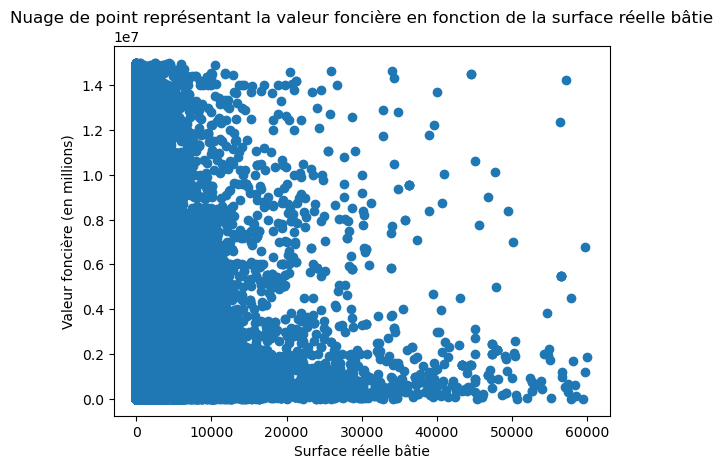

In [50]:
plt.scatter(data['Surface reelle bati'],data['Valeur fonciere'])
plt.title('Nuage de point représentant la valeur foncière en fonction de la surface réelle bâtie')
plt.xlabel('Surface réelle bâtie')
plt.ylabel('Valeur foncière (en millions)')
plt.show()

Nous pouvons voir que la valeur foncière d'un bien ne peut pas être modélisée linéairement par la surface réelle bâtie. En effet, une surface bâtie n'est pas gage de valeur pour un bien. Nous pouvons ainsi penser à une forêt ou un champs qui serait extrêmement coûteux sans pour autant qu'il y ait de bâtiments construits sur ce terrain.

#### Surface du terrain

In [ ]:
stats_col('Surface terrain')

Nous pouvons voir que la moitié des biens ne possèdent pas de terrains mais que la moitié des biens ayant un terrain ont un terrain de taille significative (quantile à 75% - 965m²). 

Nous notons cependant la présence de valeurs extrêmes avec une valeur maximale de 6 032 439m², ce qui est n'est pas représentatif du marché immobilier français. Nous retraitons ces valeurs extrêmes.

In [52]:
data = data.loc[data['Surface terrain'] < 2000]

In [ ]:
plt.scatter(data['Surface terrain'],data['Valeur fonciere'])
plt.title('Nuage de point représentant la valeur foncière en fonction de la surface du terrain')
plt.xlabel('Surface du terrain')
plt.ylabel('Valeur foncière (en millions)')
plt.show()

La représentation de la surface du terrain en fonction de la valeur foncière ne nous apprend rien. C'est un résultat attendu. En effet, la valeur d'un bien ne dépend pas uniquement de la surface de son terrain.
Certain bien n'ont pas de terrains et valent extrêmemnt chers (appartements ou maisons de ville par exemple) ; et chaque type de terrain a un prix qui lui est propre : un champs ne s'achète pas au même prix qu'une forêt.

### Surface totale

In [ ]:
stats_col('Surface totale')

Encore une fois, nous remarquons que l'écrasante majorité des biens sont des biens ayant une surface totale inférieure à 10 000m² (surface bâtie et terrain confondus).
Nous constatons donc, encore une fois, la présence de valeur extrêmes.

Nous pouvons cependant constater que certains biens n'ont ni terrain ni surface réelle bâti, nous supprimons donc ces lignes qui ne sont pas pertinentes à notre analyse.
Nous notons que certaines valeurs extrêmes sont encore présentes. Cependant, nous faisons le choix de ne pas les retraiter car nous avons déjà retraité individuellement les valeurs extrêmes de la surface bâtie et de la surface du terrain.

In [55]:
data = data.loc[data['Surface totale'] > 0]

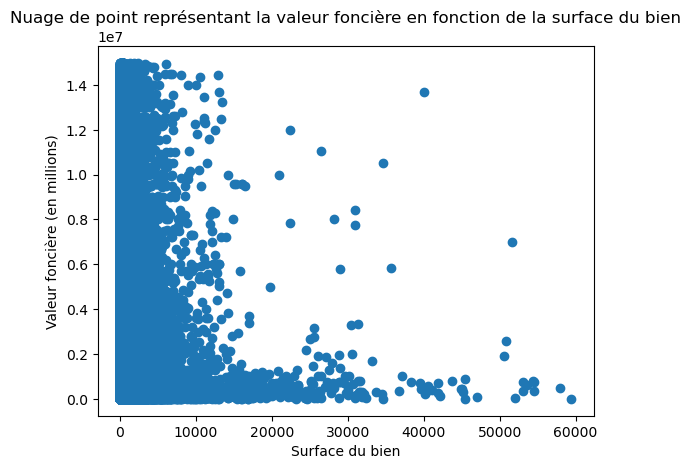

In [56]:
plt.scatter(data['Surface totale'],data['Valeur fonciere'])
plt.title('Nuage de point représentant la valeur foncière en fonction de la surface du bien')
plt.xlabel('Surface du bien')
plt.ylabel('Valeur foncière (en millions)')
plt.show()

Nous pouvons voir que la majorité des biens ont une surface totale inférieure à 10 000m². L'approximation linéaire avec uniquement la surface du bien ne semble pas être le meilleure choix pour simuler la relation entre surface du bien et valeur foncière.

En effet, la valeur d'un bien ne dépend pas uniquement de sa surface mais également du type de bien et de sa localisation. Il st cependant indéniable que la surface d'un bien influence sa valeur foncière.

## Caractéristiques du bien

### Type de local

In [57]:
stats_col('Type local')

Statistiques de la colonne :
count     12717608
unique           5
top        Terrain
freq       4702698
Name: Type local, dtype: object

 Fréquence d'occurence :
Terrain                                     4702698
Maison                                      3527897
Appartement                                 2872402
Dépendance                                  1069192
Local industriel. commercial ou assimilé     545419
Name: Type local, dtype: int64


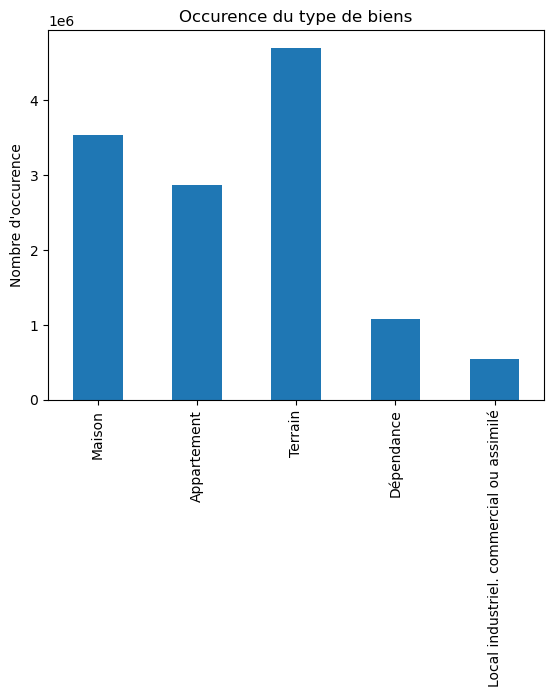

In [58]:
data['Type local'].value_counts(sort=False).plot(kind='bar')
plt.title("Occurence du type de biens")
plt.ylabel("Nombre d'occurence")
plt.show()

Nous pouvons voir que la majeure partie des biens vendus sont des terrains, puis des maisons, des appartements, et enfin des dépendances et locaux industriels ou commerciaux.

Nous cherchons à voir si le type de bien influence le la valeur foncière de celui-ci.

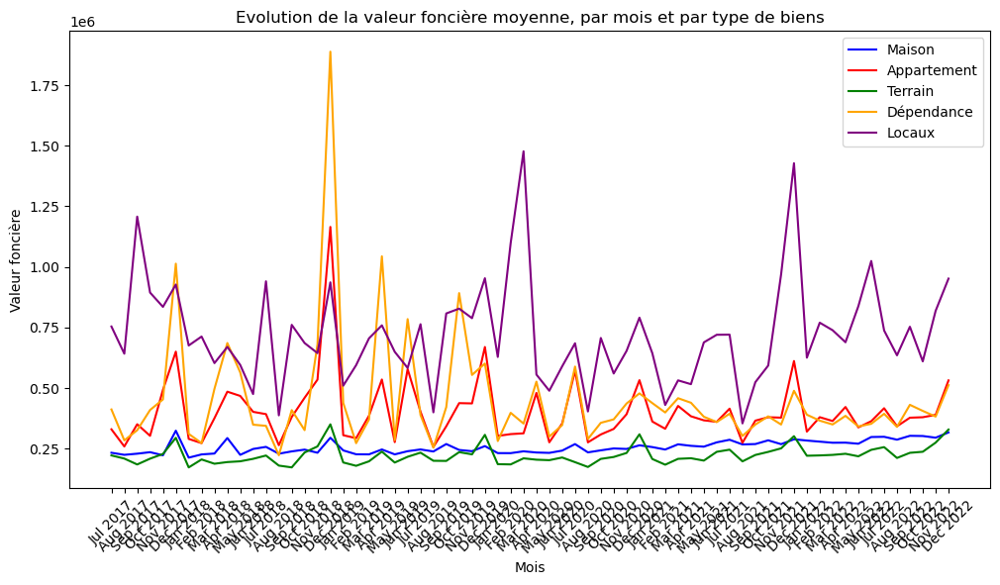

In [59]:
type_local = data.groupby(['Mois','Type local'])['Valeur fonciere'].mean().unstack()

# Convertir l'index en chaînes de caractères formatées
x_ticks = type_local.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(type_local))

# Gaphique avec la valeur foncière moyenne mensuelle par type de biens
fig, ax1 = plt.subplots(figsize=(12,6))
ax1.plot(x_tick_pos,type_local['Maison'],color='blue',label='Maison')
ax1.plot(x_tick_pos,type_local['Appartement'],color='red',label='Appartement')
ax1.plot(x_tick_pos,type_local['Terrain'],color='green',label='Terrain')
ax1.plot(x_tick_pos,type_local['Dépendance'],color='orange',label='Dépendance')
ax1.plot(x_tick_pos,type_local['Local industriel. commercial ou assimilé'],color='purple',label='Locaux')
ax1.grid(False)
ax1.set_title(f"Evolution de la valeur foncière moyenne, par mois et par type de biens")
ax1.set_xlabel('Mois')
ax1.set_xticks(x_tick_pos)
ax1.set_xticklabels(x_ticks, rotation=45)
ax1.set_ylabel('Valeur foncière')
ax1.legend()
plt.show()

Graphiquement, il est évident que le type de bien influence fortement la valeur foncière des biens.

### Nombre de pièces principales

In [ ]:
stats_col('Nombre pieces principales')

Nous pouvons voir que la majeure partie des biens présentent moins d'une dizaine de pièces principales. Nous pouvons même dire que 75% de biens ont trois pièces principales ou moins.

Nous retraitons les valeurs extrêmes en supprimant le 99ème quantile, soit tous les biens ayant plus de 7 pièces principales.

In [61]:
piece_princ = data['Nombre pieces principales'].quantile(0.99)
data = data.loc[data['Nombre pieces principales'] <= piece_princ]

In [ ]:
plt.scatter(data['Nombre pieces principales'],data['Valeur fonciere'])
plt.title('Nuage de point représentant la valeur foncière en fonction du nombre de pièces principales')
plt.xlabel('Nombre de pièces principales')
plt.ylabel('Valeur foncière (en millions)')
plt.show()

Etonnament, le nombre de pièces principales du bien n'a pas d'impact sur la valeur de celui-ci. En effet, quelque soit le nombre de pièces principales, toute la gamme des prix est disponible.

## Localisation du bien

### Région où se situe le bien

Statistiques de la colonne :
count               12639165
unique                    17
top       Nouvelle-Aquitaine
freq                 1708168
Name: Région, dtype: object

 Fréquence d'occurence :
Nouvelle-Aquitaine            1708168
Auvergne-Rhône-Alpes          1648665
Île-de-France                 1430515
Occitanie                     1425133
Hauts-de-France               1027950
Provence-Alpes-Côte d’Azur     944207
Pays de la Loire               914373
Bretagne                       803621
Bourgogne-Franche-Comté        674390
Normandie                      670873
Centre-Val de Loire            636054
Grand Est                      592291
La Réunion                      56028
Corse                           52811
Martinique                      21799
Guadeloupe                      21507
Guyane                          10780
Name: Région, dtype: int64


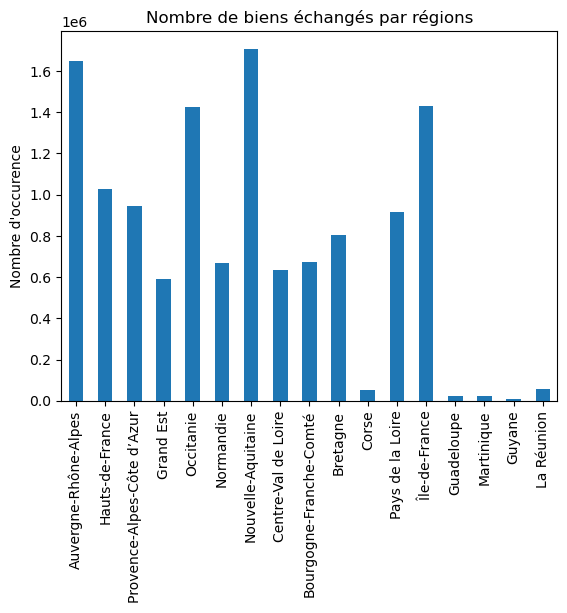

In [63]:
stats_col('Région')
data['Région'].value_counts(sort=False).plot(kind='bar')
plt.title("Nombre de biens échangés par régions")
plt.ylabel("Nombre d'occurence")
plt.show()

In [ ]:
val_region = data.groupby(['Mois','Région'])['Valeur fonciere'].mean().unstack()

# Convertir l'index en chaînes de caractères formatées
x_ticks = val_region.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(val_region))

# Gaphique avec la valeur foncière moyenne mensuelle par type de biens
for region in val_region:
    fig, ax1 = plt.subplots(figsize=(12,6))
    ax1.plot(x_tick_pos,val_region[region],color='blue')
    ax1.grid(False)
    ax1.set_title(f"Evolution de la valeur foncière moyenne, par mois, dans la région : {region}")
    ax1.set_xlabel('Mois')
    ax1.set_xticks(x_tick_pos)
    ax1.set_xticklabels(x_ticks, rotation=45)
    ax1.set_ylabel('Valeur foncière')
    plt.show()

Nous pouvons voir que la région dans laquelle se situe le bien influence la valeur foncière moyenne.

### Département où se situe le bien

Statistiques de la colonne :
count     12639165
unique          97
top           Nord
freq        414942
Name: Département, dtype: object

 Fréquence d'occurence :
Nord                     414942
Gironde                  372730
Loire-Atlantique         319275
Rhône                    282938
Bouches-du-Rhône         264931
                          ...  
Lozère                    24168
Territoire de Belfort     23332
Martinique                21799
Guadeloupe                21507
Guyane                    10780
Name: Département, Length: 97, dtype: int64


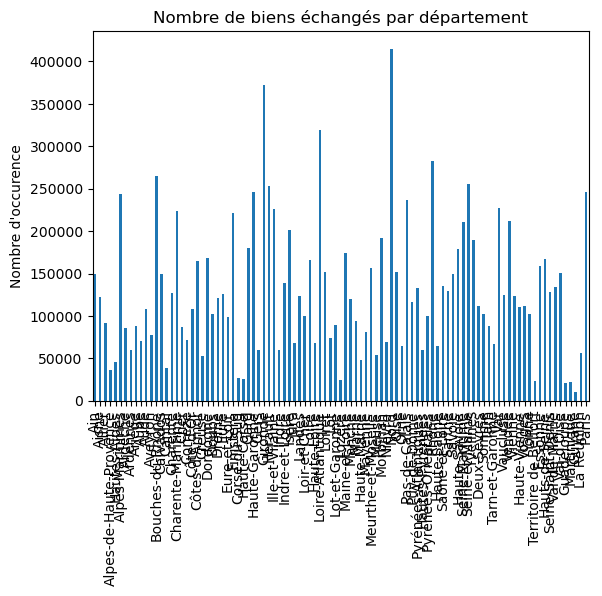

In [65]:
stats_col('Département')
data['Département'].value_counts(sort=False).plot(kind='bar')
plt.grid(False)
plt.title("Nombre de biens échangés par département")
plt.ylabel("Nombre d'occurence")
plt.show()

In [ ]:
val_dep = data.groupby(['Mois','Département'])['Valeur fonciere'].mean().unstack()

# Convertir l'index en chaînes de caractères formatées
x_ticks = val_dep.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(val_dep))

# Gaphique avec la valeur foncière moyenne mensuelle par type de biens
for dep in val_dep:
    fig, ax1 = plt.subplots(figsize=(12,6))
    ax1.plot(x_tick_pos,val_dep[dep],color='blue')
    ax1.grid(False)
    ax1.set_title(f"Evolution de la valeur foncière moyenne, par mois, dans le département : {dep}")
    ax1.set_xlabel('Mois')
    ax1.set_xticks(x_tick_pos)
    ax1.set_xticklabels(x_ticks, rotation=45)
    ax1.set_ylabel('Valeur foncière')
    plt.show()

Nous pouvons voir que le département dans lequel se situe le bien influence la valeur foncière moyenne.

## 4 - Analyse de l'impact de la crise sanitaire sur le marché de l'immobilier français, par région et département.

Nous allons maintenant séparer notre dataframe en 3 pour étudier l'impact du covid.

In [67]:
# Sélection des lignes avant le premier confinement (avant le 17 mars 2020)
data_avC = data.loc[data['Date'] < '2020-03-17']

# Sélection des lignes entre le premier et le dernier confinement (du 17 mars 2020 au 3 mai 2021)
data_C = data.loc[(data['Date'] >= '2020-03-17') & (data['Date'] < '2021-05-03')]

# Sélection des lignes après le dernier confinement (après le 3 mai 2021)
data_apC = data.loc[data['Date'] >= '2021-05-03']

# Affichage du nombre de lignes dans chaque DataFrame résultant
print("Nombre de lignes avant le premier confinement :", len(data_avC))
print("Nombre de lignes entre les confinements :", len(data_C))
print("Nombre de lignes après le dernier confinement :", len(data_apC))

Nombre de lignes avant le premier confinement : 5813025
Nombre de lignes entre les confinements : 2551342
Nombre de lignes après le dernier confinement : 4274798


### Etude générale des prix de l'immobilier

#### Prix de l'immobilier en France

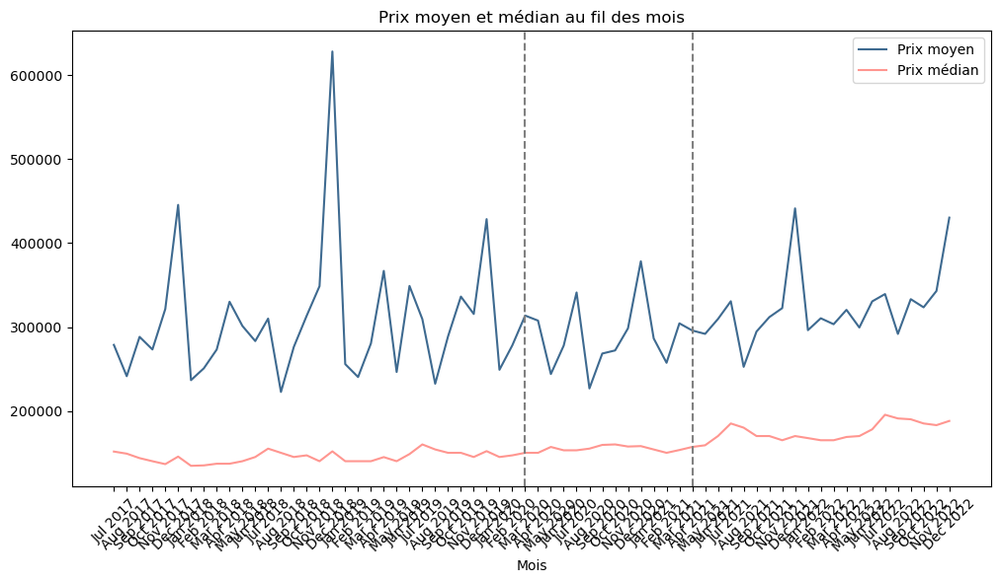

In [68]:
# Calculer le prix moyen et médian par mois
prix_moyen_mois = data.groupby('Mois')['Valeur fonciere'].mean()
prix_median_mois = data.groupby('Mois')['Valeur fonciere'].median()

# Convertir l'index en chaînes de caractères formatées
x_ticks = prix_moyen_mois.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(prix_moyen_mois))

# Créer le graphique
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(x_tick_pos, prix_moyen_mois.values, label='Prix moyen',color='#3e6a90')
ax.plot(x_tick_pos, prix_median_mois.values, label='Prix médian',color='#ff9690')
ax.set_title('Prix moyen et médian au fil des mois')
ax.set_xlabel('Mois')
ax.set_xticks(x_tick_pos)
ax.set_xticklabels(x_ticks, rotation=45)
ax.axvline(x=np.where(x_ticks=='Mar 2020')[0], color='gray', linestyle='--')
ax.axvline(x=np.where(x_ticks=='Apr 2021')[0], color='gray', linestyle='--')
ax.legend()
plt.show()

De prime abord, la crise ne semble pas avoir eut un impact significatif sur le marché de l’immobilier français. En effet, même avant la crise, le prix moyen de l’immobilier est très volatile ; on n’exclut pas la présence d’un facteur de saisonnalité dans les ventes françaises.  
Bien que la crise sanitaire n’ait pas entrainé de chute sur le marché immobilier français, nous notons que le prix médian des biens vendus en France est en augmentation depuis la fin de la crise.

#### Prix de l'immobilier par région

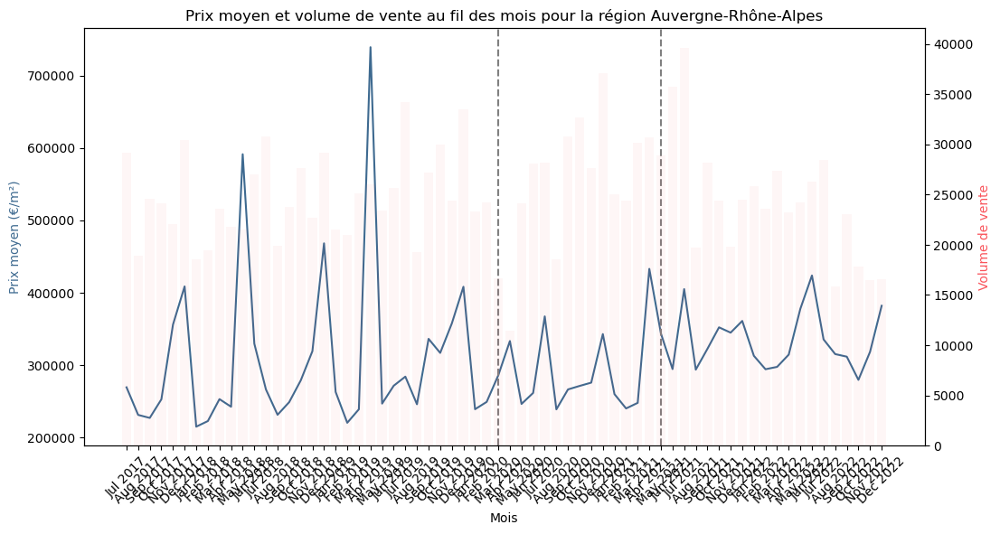

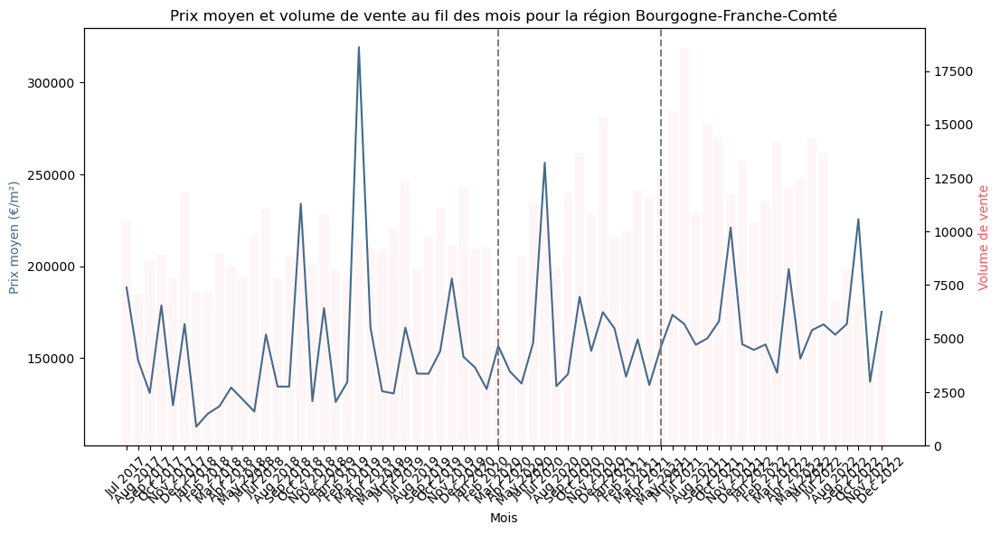

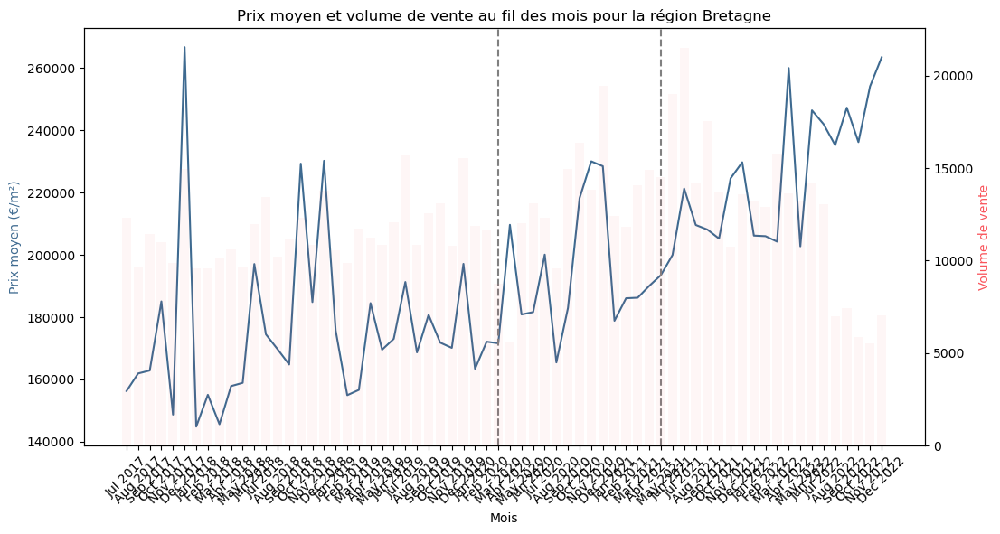

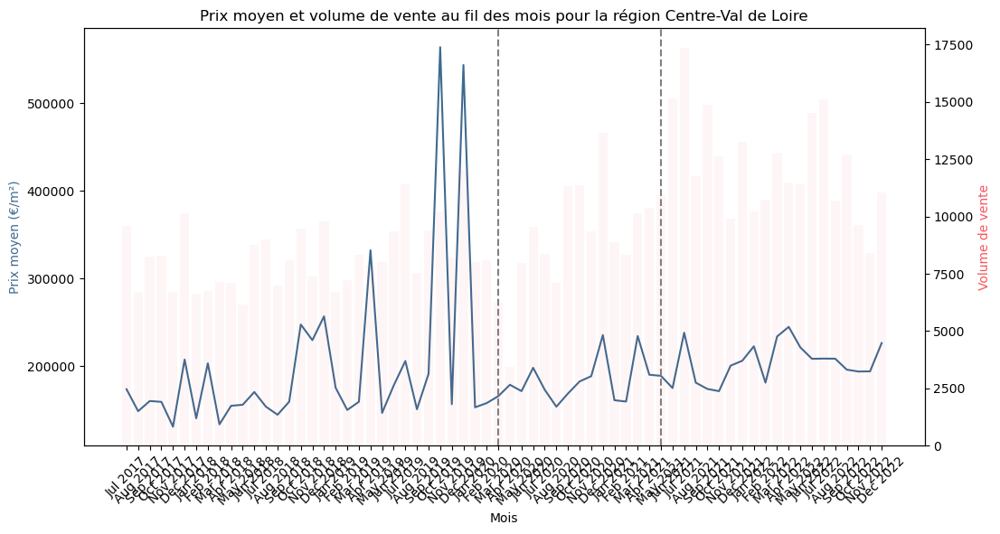

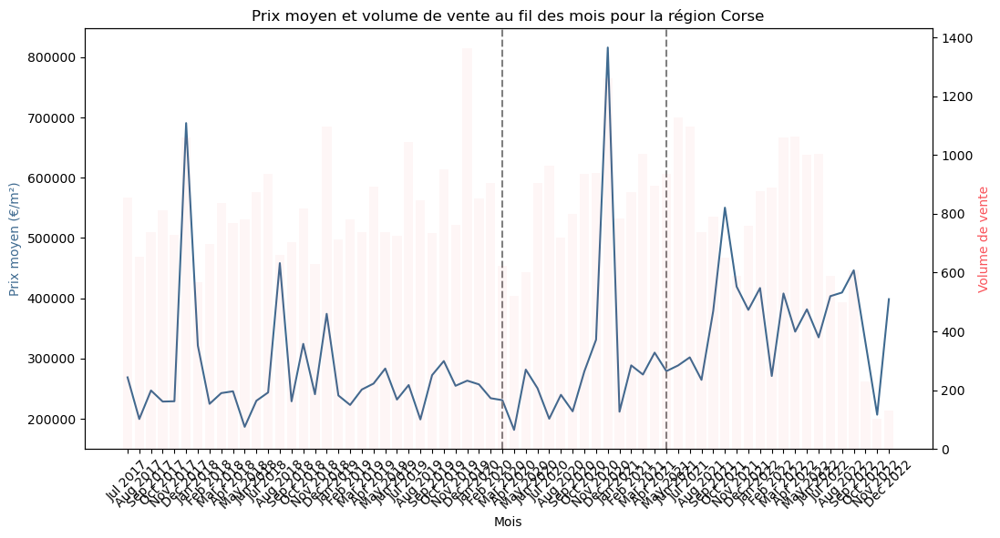

...

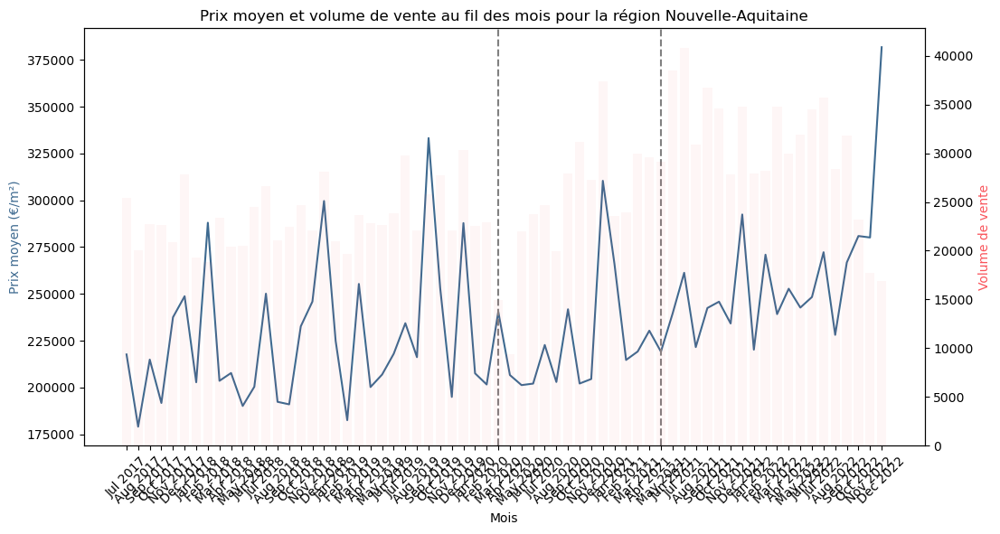

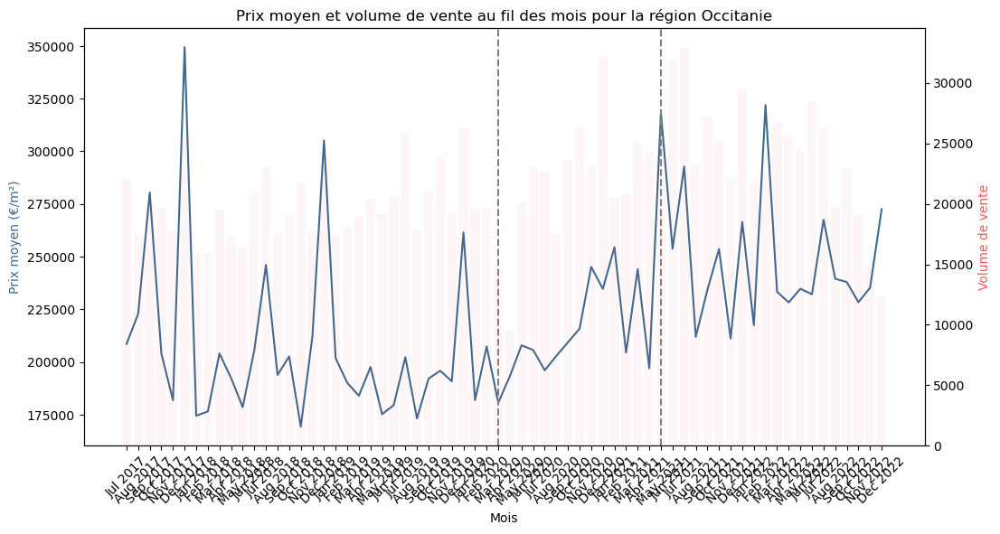

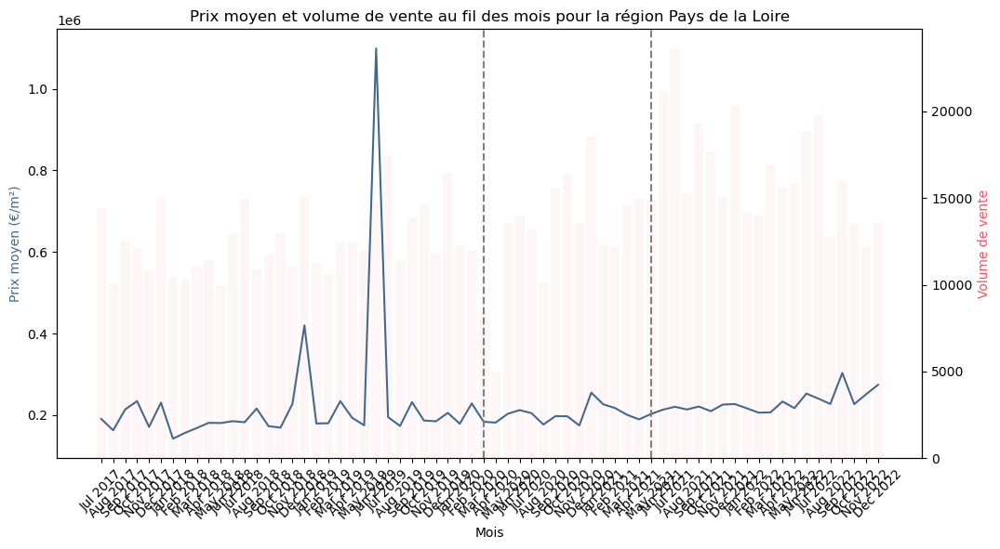

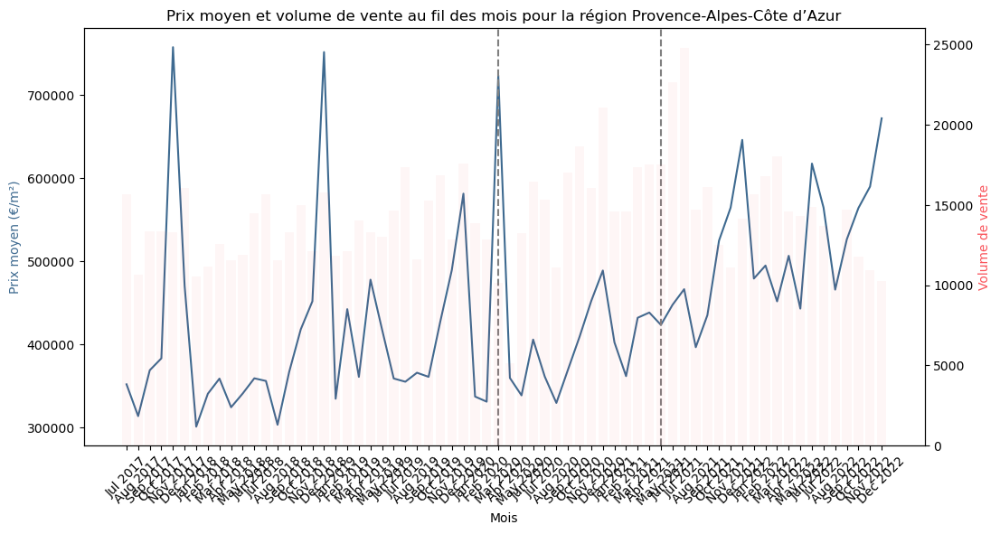

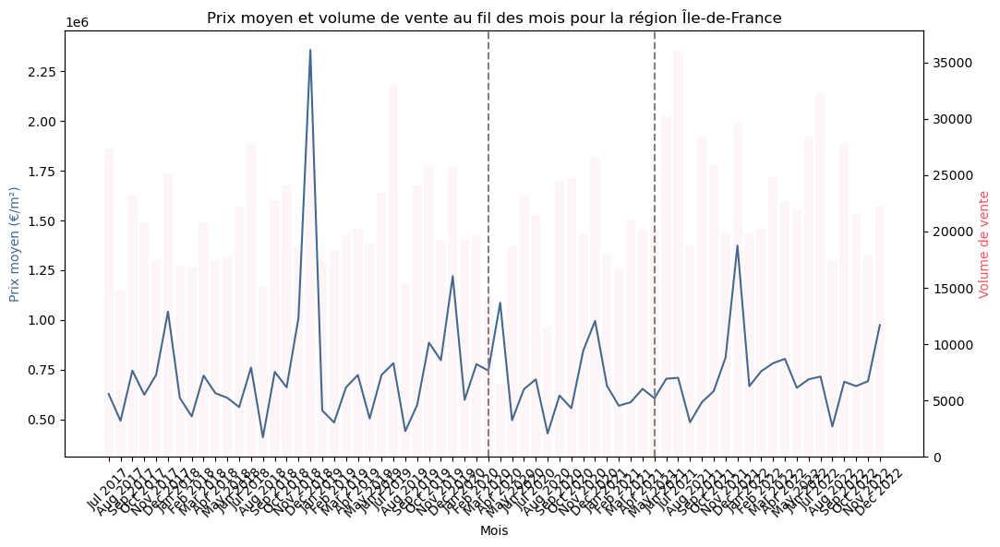

In [69]:
# Calculer le prix moyen et le volume de vente par mois pour chaque région
prix_moyen_mois_regions = data.groupby(['Mois', 'Région'])['Valeur fonciere'].mean().unstack()
volume_vente_mois_regions = data.groupby(['Mois', 'Région'])['Valeur fonciere'].count().unstack()

# Convertir l'index en chaînes de caractères formatées
x_ticks = prix_moyen_mois_regions.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(prix_moyen_mois_regions))

# Créer le graphique pour chaque région
for region in prix_moyen_mois_regions.columns:
    fig, ax1 = plt.subplots(figsize=(12, 6))
    ax1.plot(x_tick_pos, prix_moyen_mois_regions[region], color='#3e6a90')
    ax1.set_title(f'Prix moyen et volume de vente au fil des mois pour la région {region}')
    ax1.set_xlabel('Mois')
    ax1.set_ylabel('Prix moyen (€/m²)', color='#3e6a90')
    ax1.set_xticks(x_tick_pos)
    ax1.set_xticklabels(x_ticks, rotation=45)
    ax1.axvline(x=np.where(x_ticks=='Mar 2020')[0], color='gray', linestyle='--')
    ax1.axvline(x=np.where(x_ticks=='May 2021')[0], color='gray', linestyle='--')
    
    ax2 = ax1.twinx()
    ax2.bar(x_tick_pos, volume_vente_mois_regions[region], color='#f9545b', alpha=0.05)
    ax2.set_ylabel('Volume de vente', color='#f9545b')
    
    plt.show()

Nous pouvons constater que le prix moyen de l'immobilier dépend fortement de la région dans laquelle se trouve le bien.

Ces graphiques permettent de mettre en évidence l'impacte que la crise sanitaire a eut dans certaines régions.
- Bretagne : malgré que le volume des ventes se soit effondré, le prix moyen de l'immobilier a explosé.
- Centre-Val de Loire : le prix moyen de l'immobilier est en légèrement aufmentation, mais le volume des transactions est plus élevé qu'avant le Covid.
- Guadeloupe : depuis la crise sanitaire, le nombre de transations a chuté, atteignant moins de 100 transactions par mois sur plusieurs mois.
- Nouvelle Aquitain : suite à la crise sanitaire, nous avons une hauss du nombre de transactions avec un prix moyen en hausse (qui atteint des sommets fin 2022).
- Provence-Alpes-Côte d'Azur : le nombre de ventes ne semble pas avoir été impacté par la crise, cependant nous constatons une hausse du prix moyen de l'immobilier dans la région.

Nous pouvons donc conclure que la crise sanitaire a impacté différemment chaque région française. 

#### Prix de l'immobilier par département

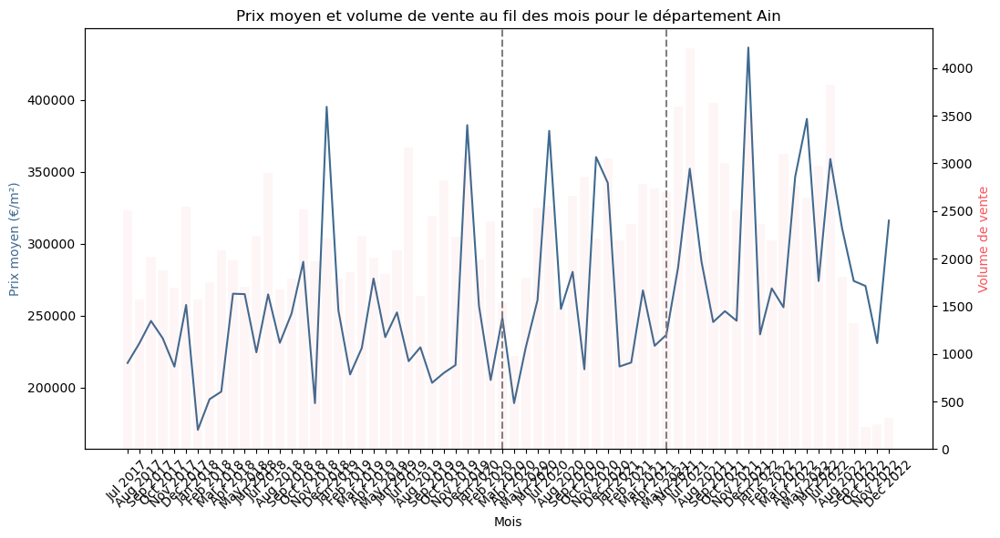

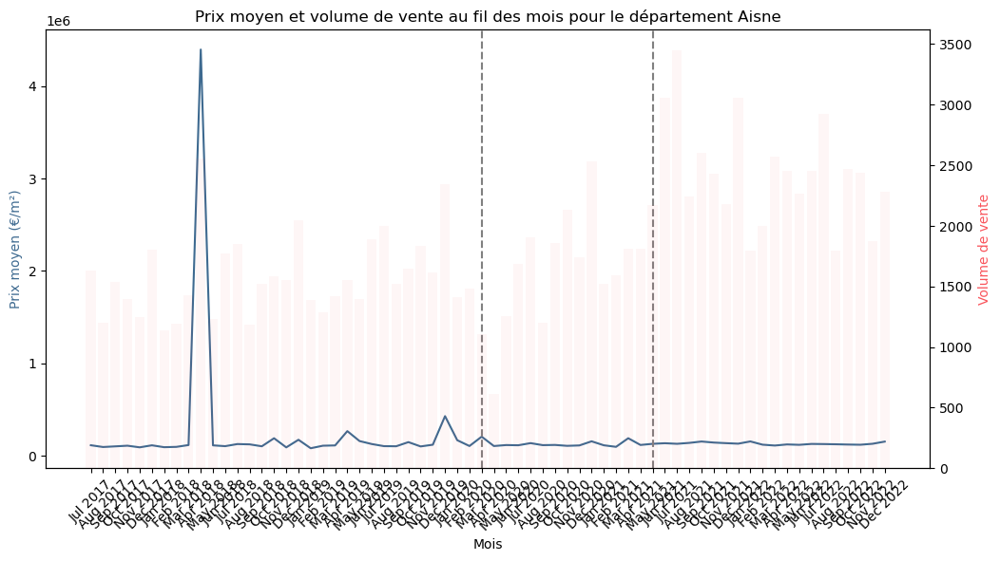

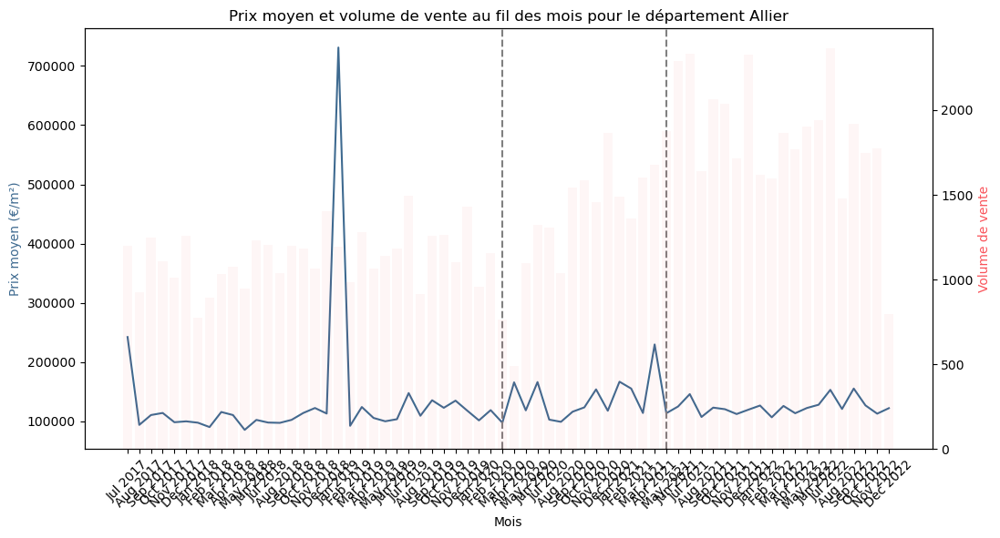

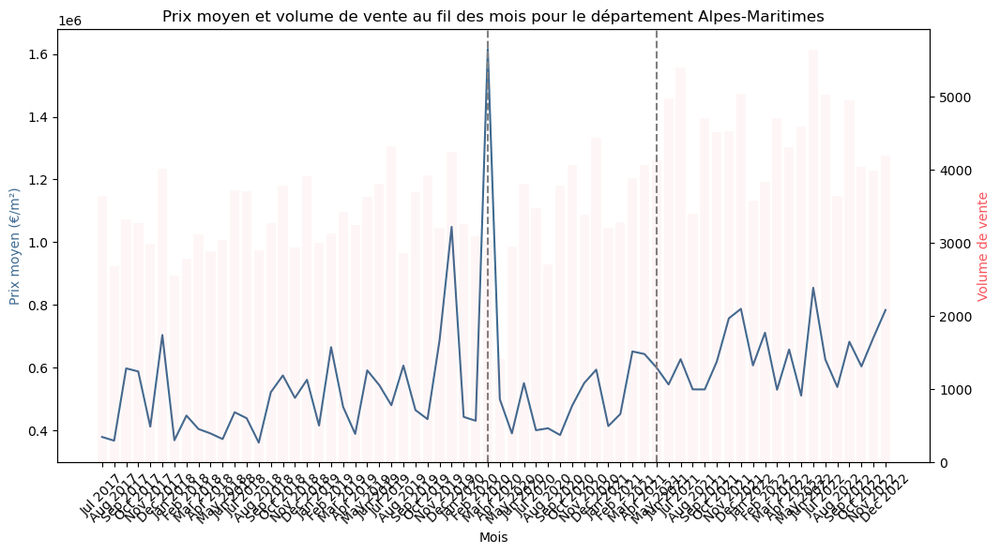

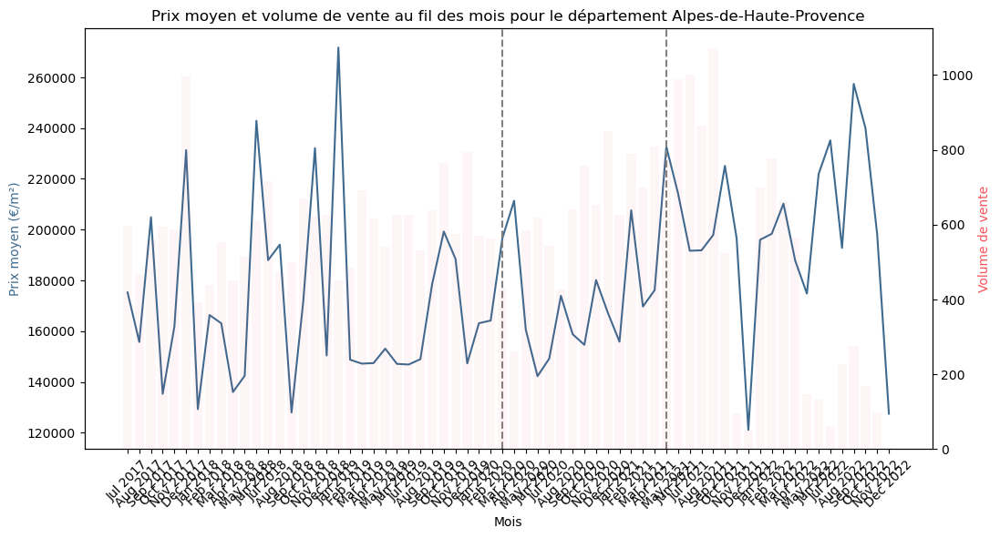

...

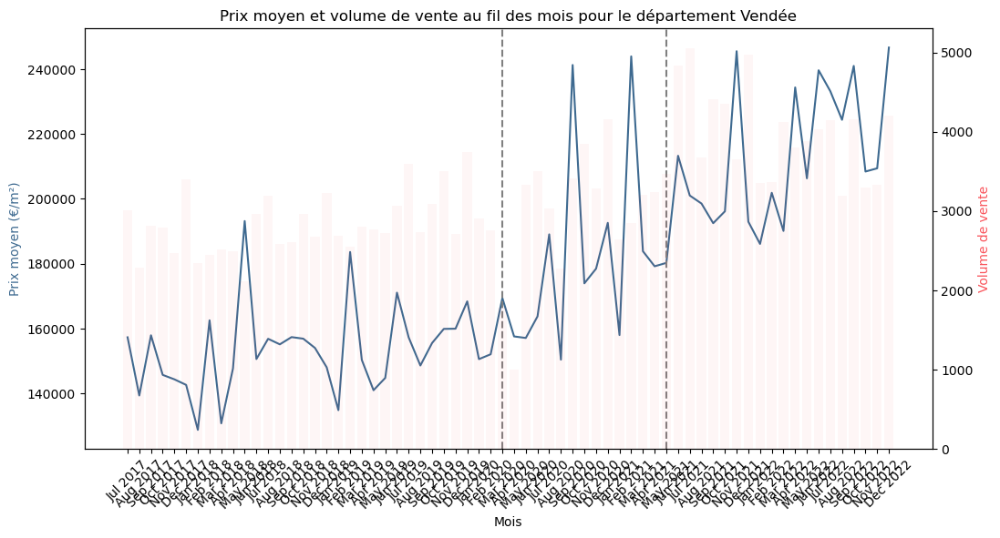

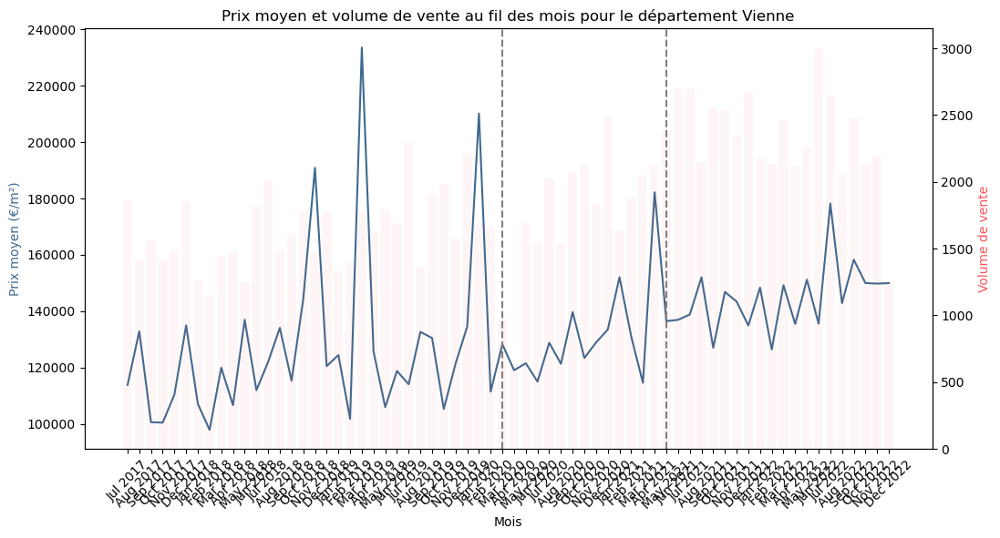

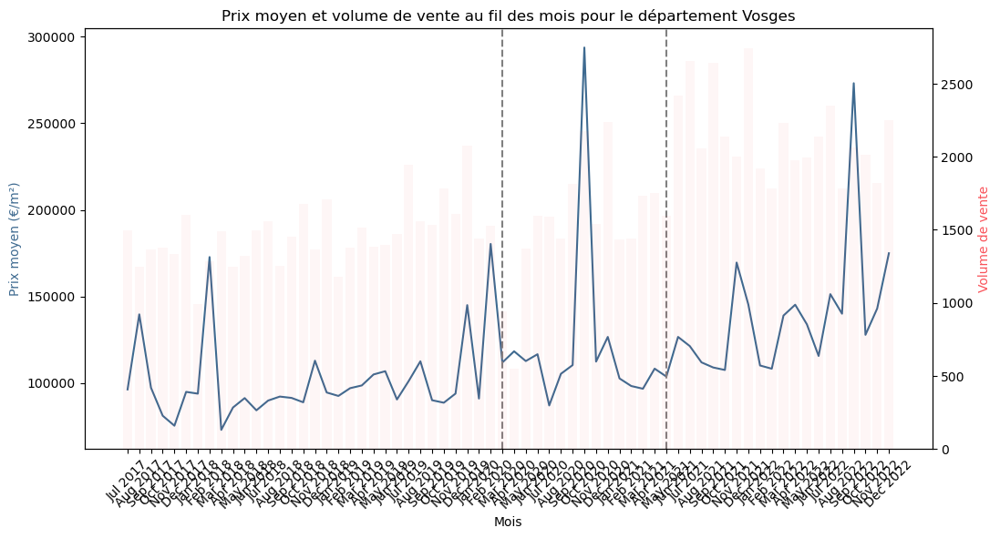

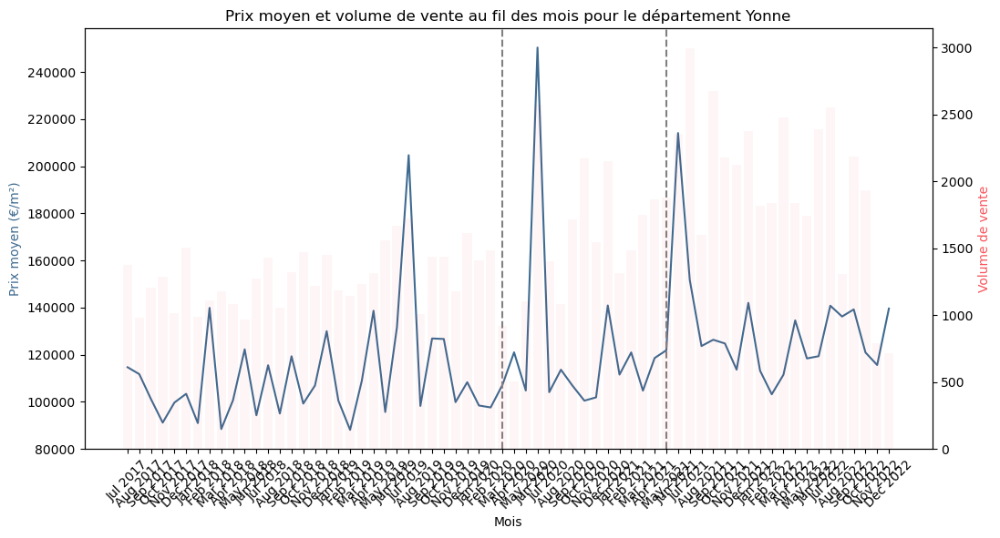

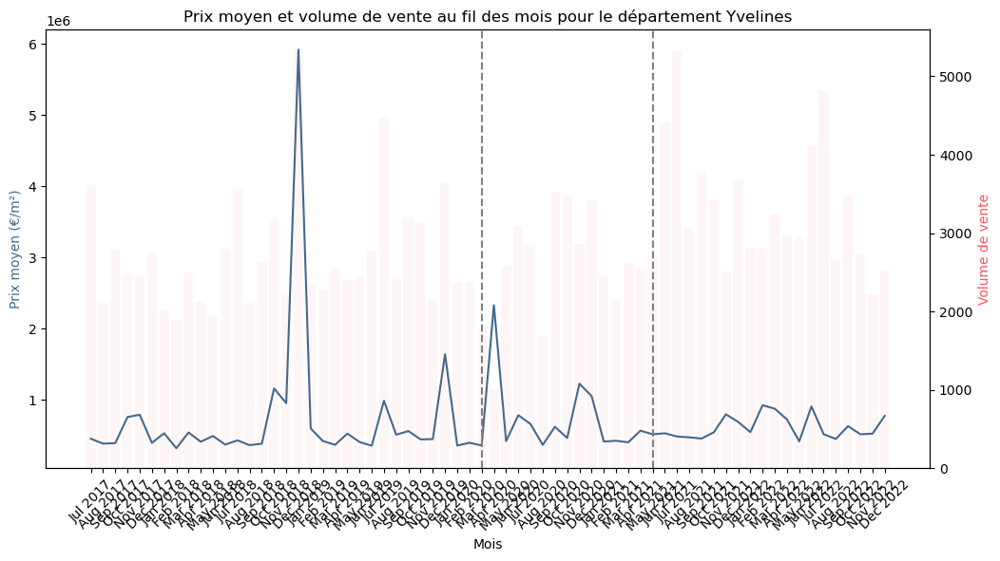

In [70]:
# Calculer le prix moyen et le volume de vente par mois pour chaque département
prix_moyen_mois_departement = data.groupby(['Mois', 'Département'])['Valeur fonciere'].mean().unstack()
volume_vente_mois_departement = data.groupby(['Mois', 'Département'])['Valeur fonciere'].count().unstack()

# Convertir l'index en chaînes de caractères formatées
x_ticks = prix_moyen_mois_departement.index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(prix_moyen_mois_departement))

# Créer le graphique pour chaque région
for departement in prix_moyen_mois_departement.columns:
    fig, ax1 = plt.subplots(figsize=(12, 6))
    ax1.plot(x_tick_pos, prix_moyen_mois_departement[departement], color='#3e6a90')
    ax1.set_title(f'Prix moyen et volume de vente au fil des mois pour le département {departement}')
    ax1.set_xlabel('Mois')
    ax1.set_ylabel('Prix moyen (€/m²)', color='#3e6a90')
    ax1.set_xticks(x_tick_pos)
    ax1.set_xticklabels(x_ticks, rotation=45)
    ax1.axvline(x=np.where(x_ticks=='Mar 2020')[0], color='gray', linestyle='--')
    ax1.axvline(x=np.where(x_ticks=='May 2021')[0], color='gray', linestyle='--')
    
    ax2 = ax1.twinx()
    ax2.bar(x_tick_pos, volume_vente_mois_departement[departement], color='#f9545b', alpha=0.05)
    ax2.set_ylabel('Volume de vente', color='#f9545b')
    
    plt.show()

Comme dans le cas des régions, la crise sanitaire a impacté différement chaque département français. Par exemple:
- Ardèche : le volume des ventes a fortement baissé mais le prix moyen de l'immobilier reste élevé (si l'on exclut la valeur d'octobre 2021, qui est une anomalie).
- Bouches-du-Rhône : la crise sanitaire semble avoir eut peu d'impact avec des volumes de ventes et un prix moyen similaire avant et après la crise.
- Calvados : le nombre de transaction est resté stable jusqu'en 2022, ce qui suggère que la hausse des taux d'intérêt a eut un impact plus négatif que la crise sanitaire sur le marché de l'immobilier de ce département.
- Deux-Sèvres : après la crise sanitaire, nous avons une forte augmentation du nombre de transactions et du prix moyen des biens.
- Gironde : le prix moyen de l'immobilier reste aussi volatile avant et après Covid mais le volume des ventes a augmenté.
- Marne : après la crise, le nombre de transactions a fortment augmenté avant de diminuer en 2022.
- Vosges : le prix de l'immobilier et le nombre de transactions ont augmenté depuis la crise.

Nous pouvons donc conclure que la crise sanitaire a impacté différemment chaque région française. 

### Analyse du type de bien vendus sur le marché de l'immobilier français

#### Au niveau national

In [71]:
# Récupération des données - nombre de locaux vendus par type, par an
nb_type_local = data.groupby(['Type local', 'Année'])['Type local'].count().unstack()

# Récupération des données - nombre de logements vendus par ans en fonction du nombre de pièces principales
nb_piece = pd.DataFrame()

for annee in nb_type_local.columns:
    data_t1_t2 = data[(data['Nombre pieces principales'] <= 2) & (data['Année'] == annee)]
    data_t3_t5 = data[(data['Nombre pieces principales'] >= 3) & (data['Nombre pieces principales'] <= 5) & (data['Année'] == annee)]
    data_plus_de_5_pieces = data[(data['Nombre pieces principales'] > 5) & (data['Année'] == annee)]

    nb_piece[annee] = [data_t1_t2['Année'].count(),data_t3_t5['Année'].count(),data_plus_de_5_pieces['Année'].count()]

nb_piece.index = ['T1/2','T3/4/5','T6 et +']

# Palettes de couleur des graphiques
colors = ['#3e6a90','#9ae1d4','#f9d4db','#ff9690','#f9545b']
colors2 = ['#3e6a90','#9ae1d4','#f9d4db']

def etude_annuelle(annee):
    
    # Diagramme - Type de local vendus dans l'année
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(nb_type_local[annee],autopct='%1.1f%%',colors=colors)
    ax.set_title(f'Répartition des ventes par type de local en {annee}')

    ax.legend(nb_type_local.index,
              title ="Type de local",
              loc ="center left",
              bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()
    
    # Diagramme - Nombre de biens vendus dans l'année en fonction du nombre de pièces principales
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(nb_piece[annee],autopct='%1.1f%%',colors=colors2)
    ax.set_title(f'Répartition des ventes par taille du bien en {annee}')

    ax.legend(nb_piece.index,
                title ="Taille du bien",
                loc ="center left",
                bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()

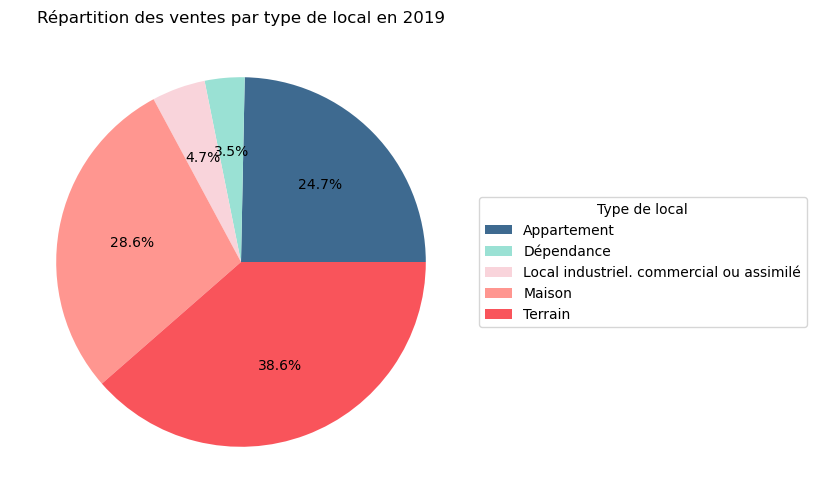

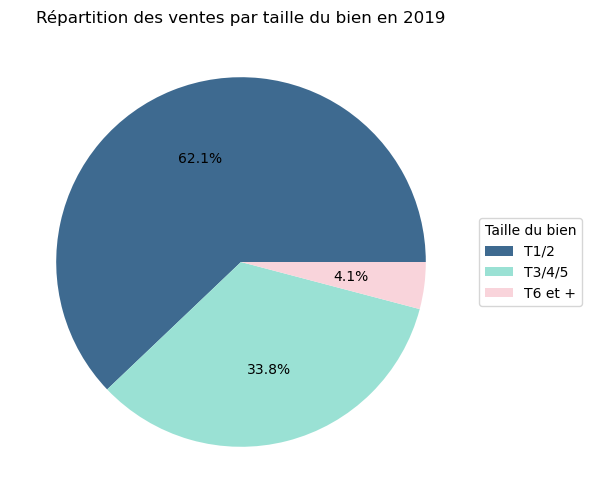

In [72]:
etude_annuelle("2019")

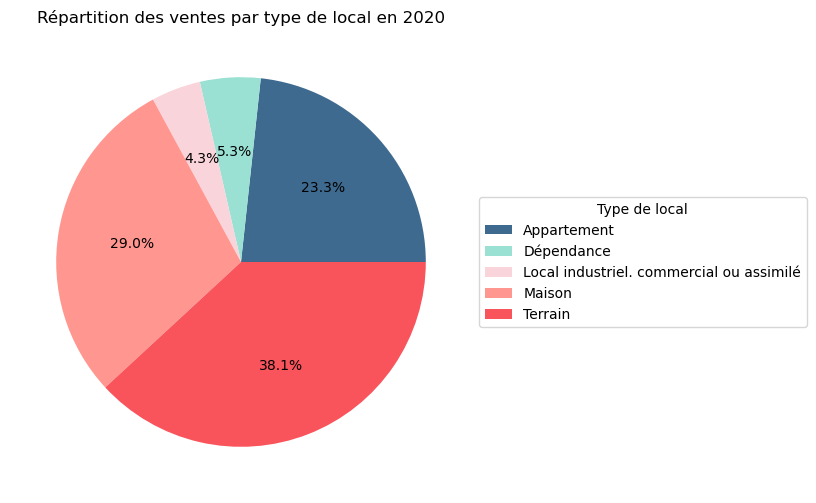

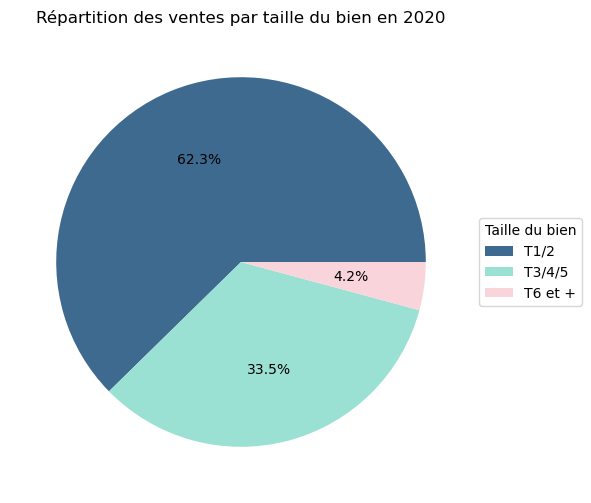

In [73]:
etude_annuelle("2020")

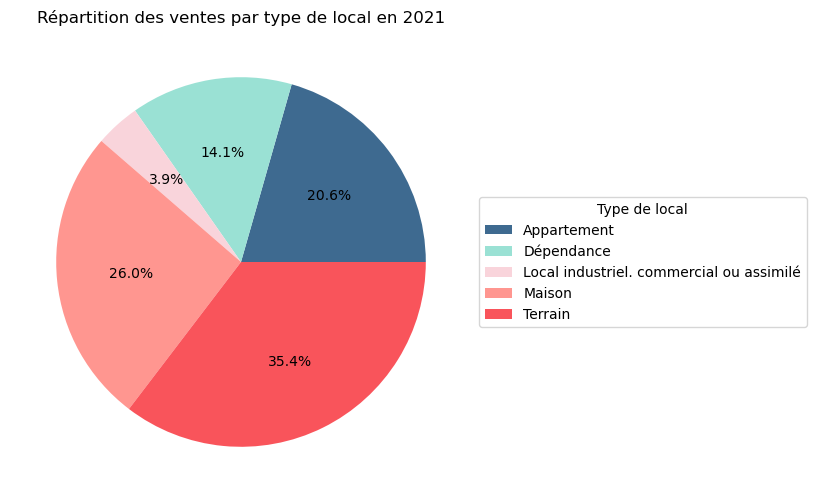

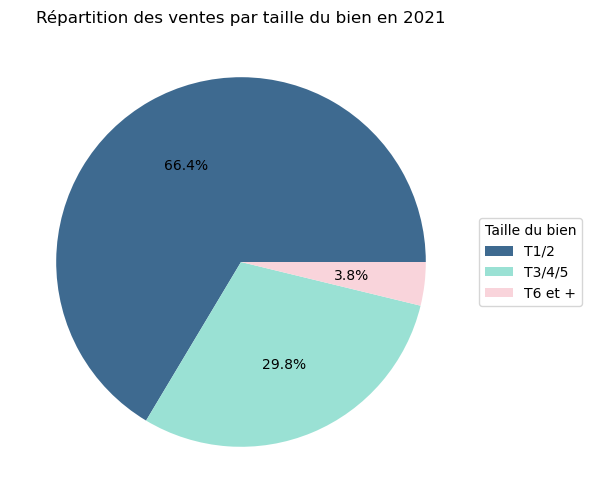

In [74]:
etude_annuelle("2021")

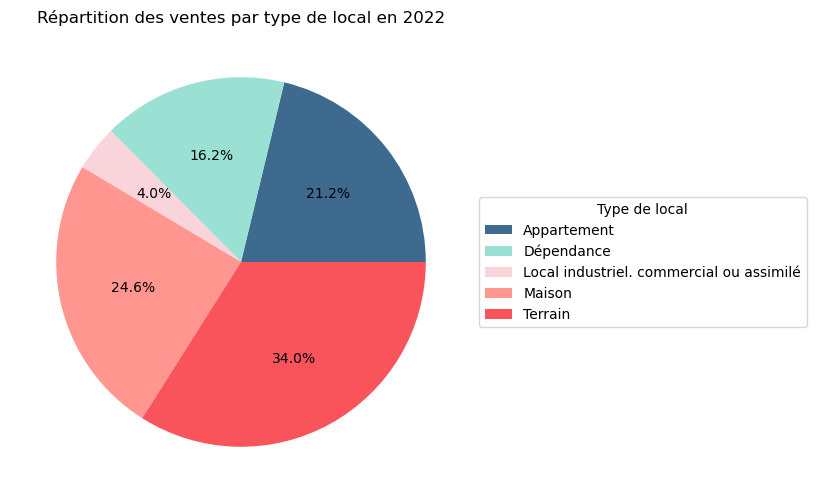

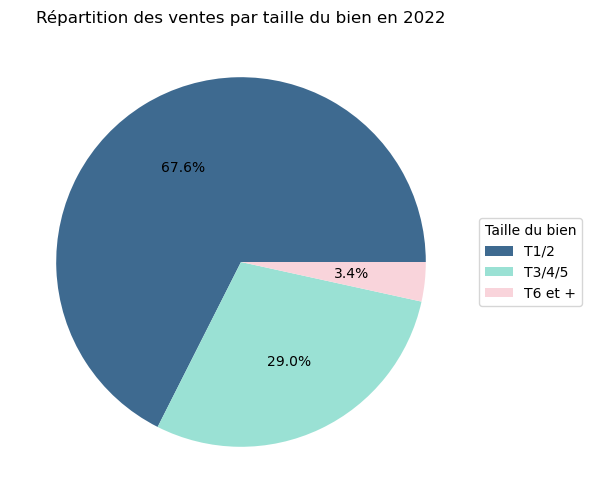

In [75]:
etude_annuelle("2022")

Cette fonction nous permet de comparer les ventes effectuées sur plusieurs années.  
Ainsi, nous pouvons voir qu'entre 2019 et 2022, la part des ventes de dépendance a fortement augmenté (+ 15%). En contrepartie, ce sont les ventes de terrain (- 6,8 %), d'appartements (- 3,6%), et de maisons (- 3,9%) qui ont diminué.
Lorsque nous regardons les diagrammes circulaires, nous pouvons voir que ces changements de proportion s'opèrent entre 2020 et 2021. Ceci nous permet de déterminer que la crise sanitaire a eut un impact sur le type de biens vendus sur le marché de l'immobilier français.

Ces graphiques nous permettent également de constater que la majorité des biens vendus, quelque soit l'année sont des biens dits T1/T2, soit des biens ayant une ou deux pièces principales. Nous notons cependant qu'après la crise sanitaire, nous avons une légère augmentation (de 70 à 75%) de la proportion de biens T1 et T2 vendus. 
Il semblerait donc que la crise sanitaire ait donné lieu à de plus nombreuses transactions de biens avec peu de pièces principales.

#### Au niveau régional

In [76]:
def etude_regionale(region,an):
    # Récupération des données de la région
    df_region = data.loc[data['Région'] == region]
    
    # Récupération du nombre de biens vendus par type
    region_type = df_region.groupby(['Type local', 'Année'])['Type local'].count().unstack()
    
    # Récupération des données - nombre de logements vendus par ans en fonction du nombre de pièces principales
    nb_piece = pd.DataFrame()

    for annee in region_type.columns:
        data_t1_t2 = df_region[(df_region['Nombre pieces principales'] <= 2) & (df_region['Année'] == annee)]
        data_t3_t5 = df_region[(df_region['Nombre pieces principales'] >= 3) & (df_region['Nombre pieces principales'] <= 5) & (df_region['Année'] == annee)]
        data_plus_de_5_pieces = df_region[(df_region['Nombre pieces principales'] > 5) & (df_region['Année'] == annee)]

        nb_piece[annee] = [data_t1_t2['Année'].count(),data_t3_t5['Année'].count(),data_plus_de_5_pieces['Année'].count()]

    nb_piece.index = ['T1/2','T3/4/5','T6 et +']
    
    #  Rappel des valeurs de la moyenne et de la médiane de la valeur foncière des biens
    print(round(df_region[["Valeur fonciere","Année"]].groupby("Année").agg(["count","mean","median"]),0))
    
    # Diagramme du nombre de biens vendus par ans, en fonction de leur type
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(region_type[an],autopct='%1.1f%%',colors=colors)
    ax.set_title(f'Répartition des ventes par type de local en {region} ({an})')

    ax.legend(region_type.index,
              title ="Type de local",
              loc ="center left",
              bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()
    
    # Diagramme - Nombre de biens vendus dans l'année en fonction du nombre de pièces principales
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(nb_piece[an],autopct='%1.1f%%',colors=colors2)
    ax.set_title(f'Répartition des ventes par taille du bien en {region} ({an})')

    ax.legend(nb_piece.index,
                title ="Taille du bien",
                loc ="center left",
                bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            69216  185426.0  120000.0
2018           133302  178775.0  120000.0
2019           144800  175852.0  125900.0
2020           149395  195033.0  138000.0
2021           178035  203428.0  150000.0
2022           128873  229846.0  167000.0


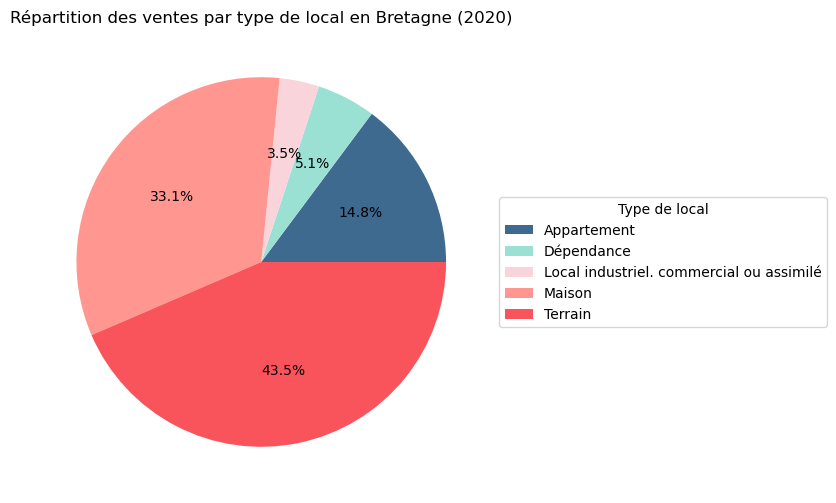

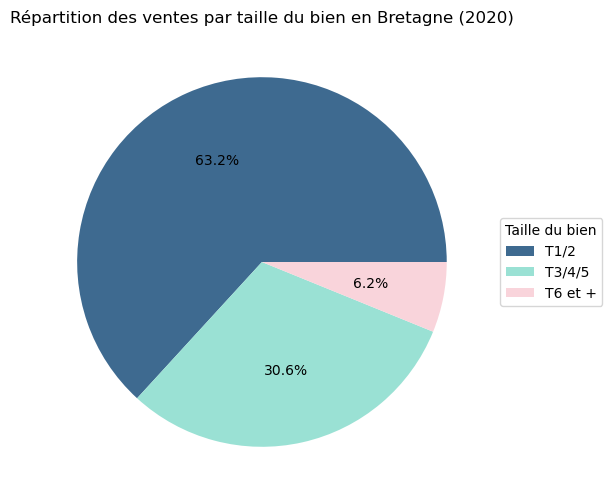

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            69216  185426.0  120000.0
2018           133302  178775.0  120000.0
2019           144800  175852.0  125900.0
2020           149395  195033.0  138000.0
2021           178035  203428.0  150000.0
2022           128873  229846.0  167000.0


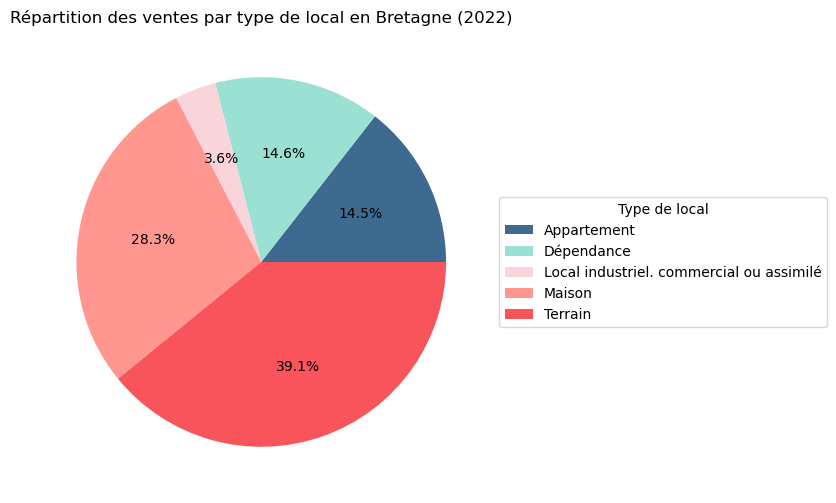

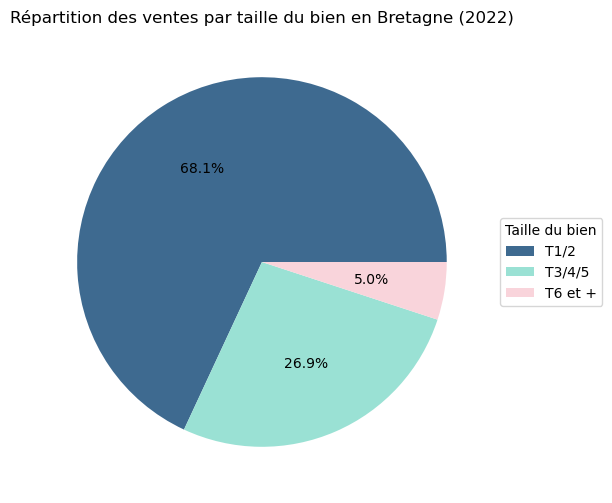

In [77]:
etude_regionale('Bretagne','2020')
etude_regionale('Bretagne','2022')

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            49660  167119.0  110000.0
2018            93309  183088.0  110000.0
2019           106347  262681.0  115000.0
2020           104458  181359.0  120000.0
2021           143532  192255.0  129500.0
2022           138748  212461.0  137000.0


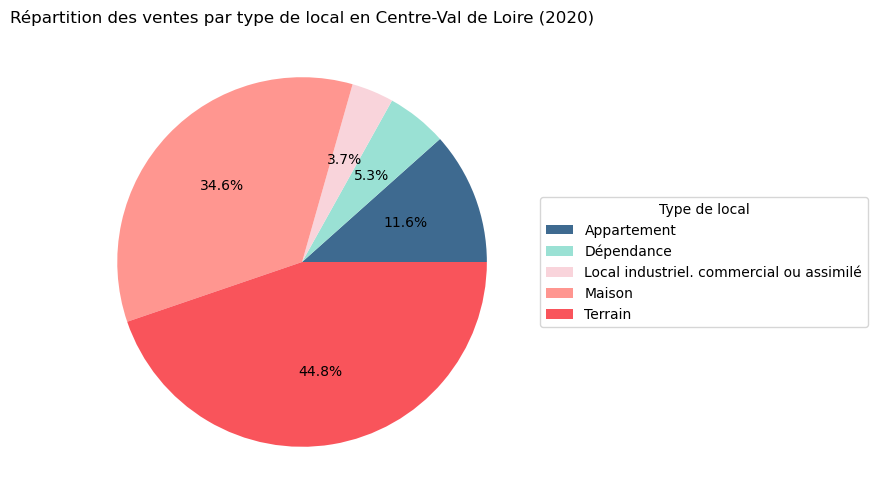

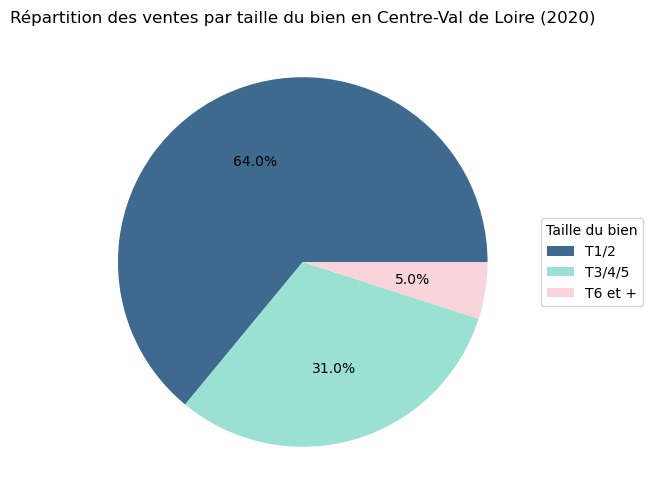

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            49660  167119.0  110000.0
2018            93309  183088.0  110000.0
2019           106347  262681.0  115000.0
2020           104458  181359.0  120000.0
2021           143532  192255.0  129500.0
2022           138748  212461.0  137000.0


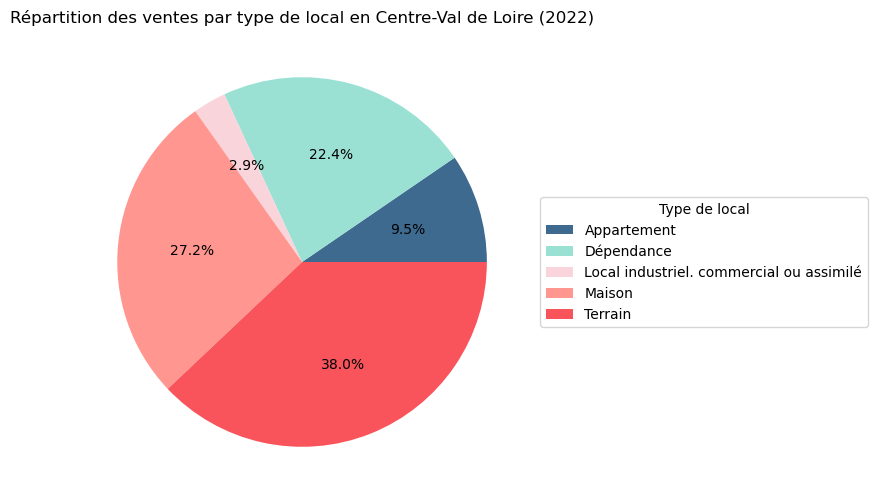

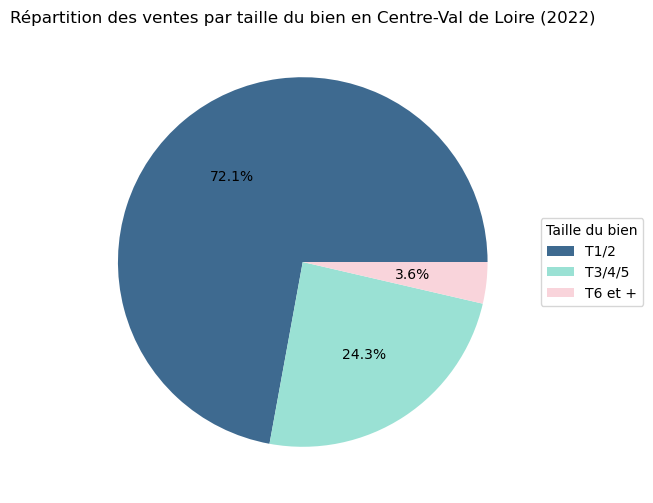

In [78]:
etude_regionale('Centre-Val de Loire','2020')
etude_regionale('Centre-Val de Loire','2022')

      Valeur fonciere                     
                count       mean    median
Année                                     
2017             2171  1898124.0  162000.0
2018             4818  1020374.0  150000.0
2019             4692   448367.0  150000.0
2020             4538   781919.0  157000.0
2021             3042   442615.0  175075.0
2022             2246   327661.0  153000.0


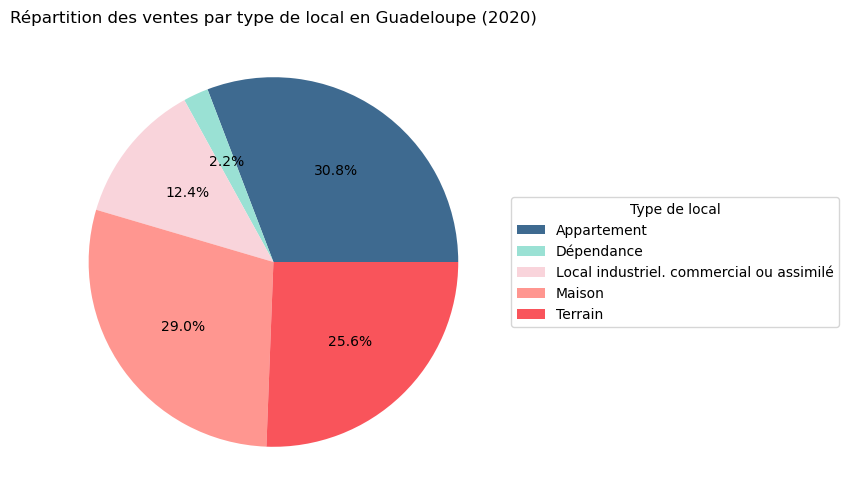

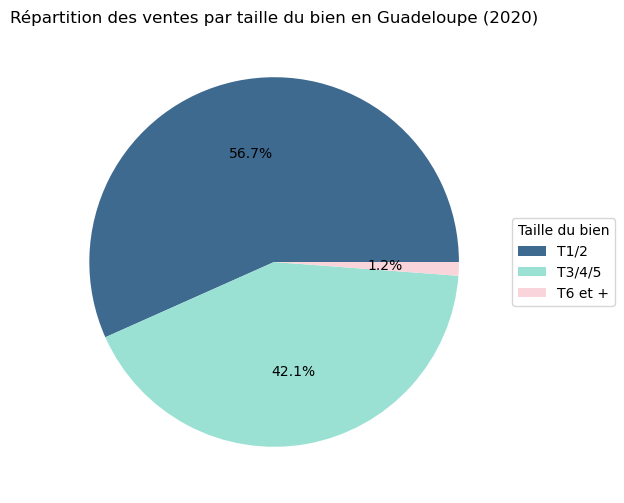

      Valeur fonciere                     
                count       mean    median
Année                                     
2017             2171  1898124.0  162000.0
2018             4818  1020374.0  150000.0
2019             4692   448367.0  150000.0
2020             4538   781919.0  157000.0
2021             3042   442615.0  175075.0
2022             2246   327661.0  153000.0


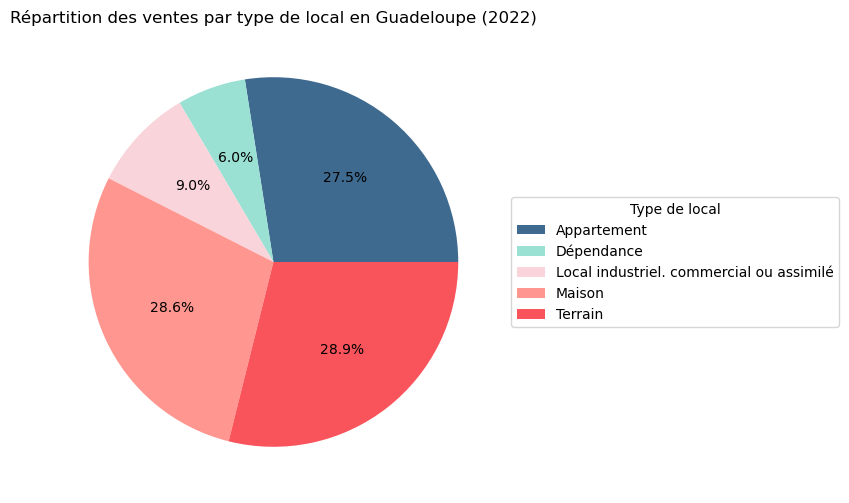

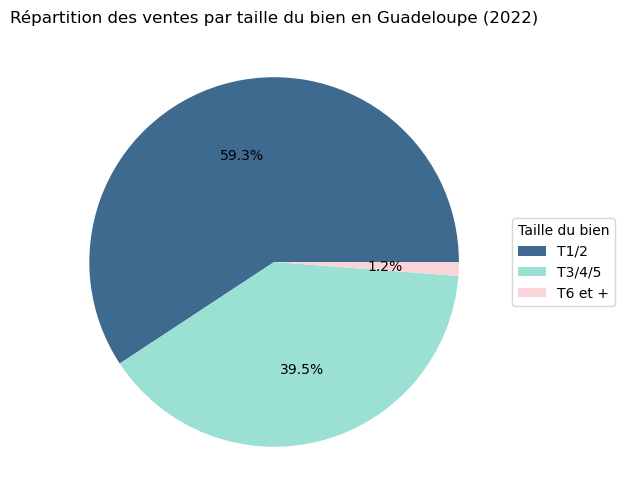

In [79]:
etude_regionale('Guadeloupe','2020')
etude_regionale('Guadeloupe','2022')

      Valeur fonciere                    
                count      mean    median
Année                                    
2017           139508  216591.0  125000.0
2018           271953  226985.0  124000.0
2019           291404  237439.0  126506.0
2020           283887  224811.0  135650.0
2021           380402  241850.0  150000.0
2022           341014  259818.0  161500.0


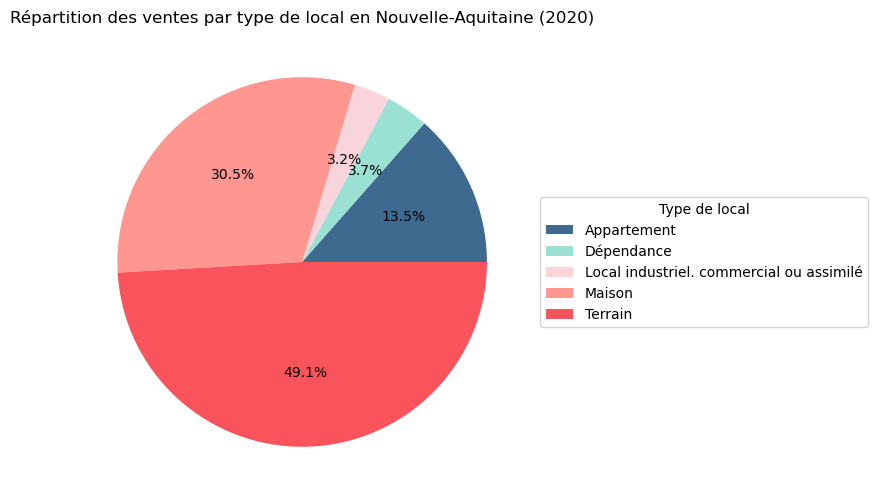

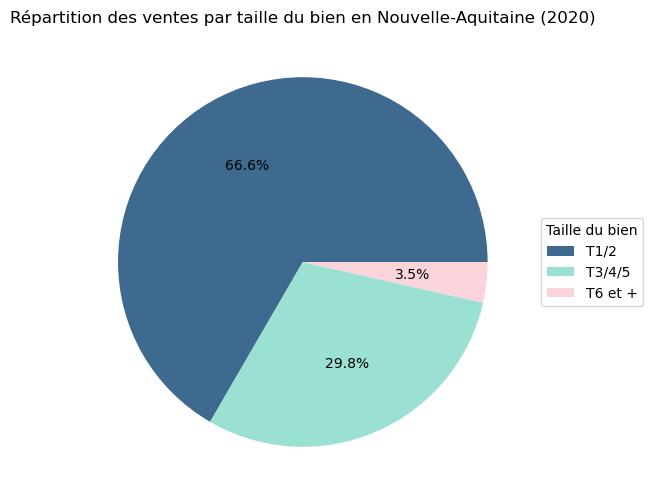

      Valeur fonciere                    
                count      mean    median
Année                                    
2017           139508  216591.0  125000.0
2018           271953  226985.0  124000.0
2019           291404  237439.0  126506.0
2020           283887  224811.0  135650.0
2021           380402  241850.0  150000.0
2022           341014  259818.0  161500.0


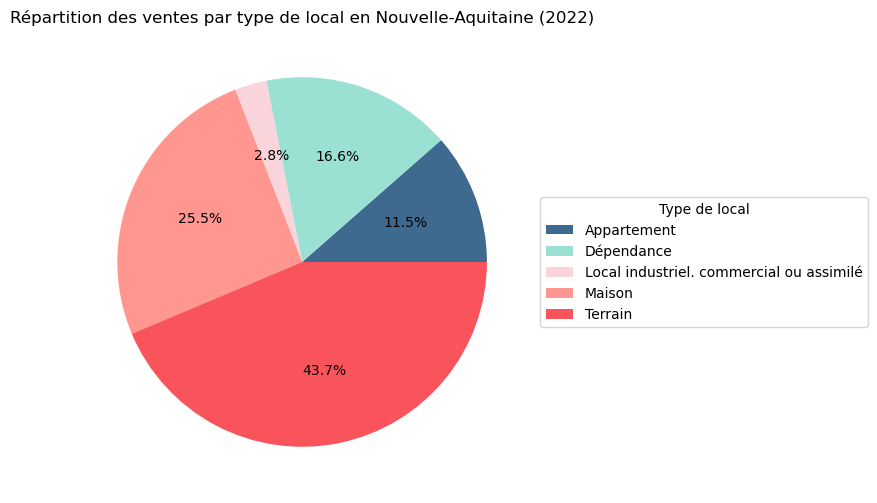

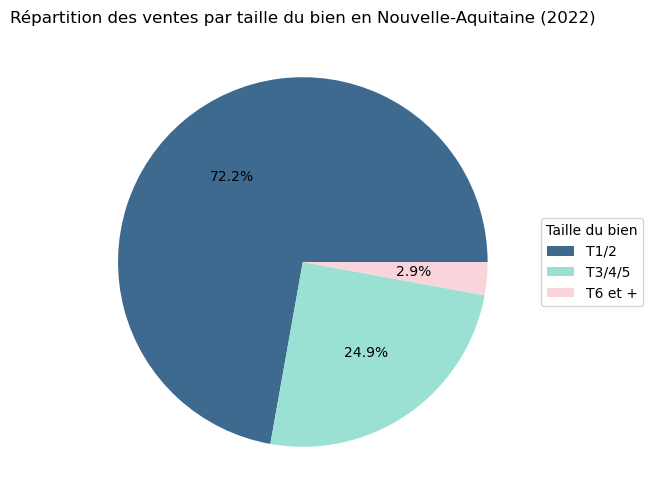

In [80]:
etude_regionale('Nouvelle-Aquitaine','2020')
etude_regionale('Nouvelle-Aquitaine','2022')

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            82506  443318.0  220000.0
2018           155657  398693.0  210000.0
2019           170462  416866.0  215000.0
2020           171073  409335.0  232000.0
2021           197815  456808.0  264500.0
2022           166694  524860.0  282000.0


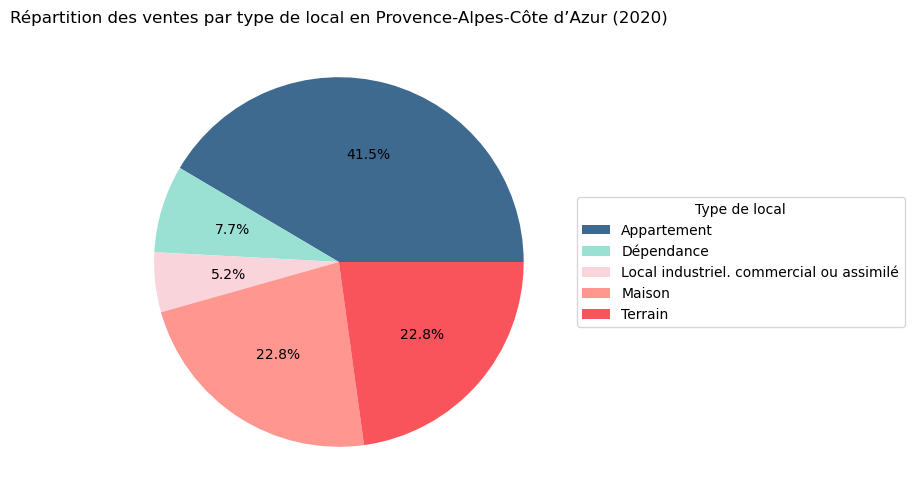

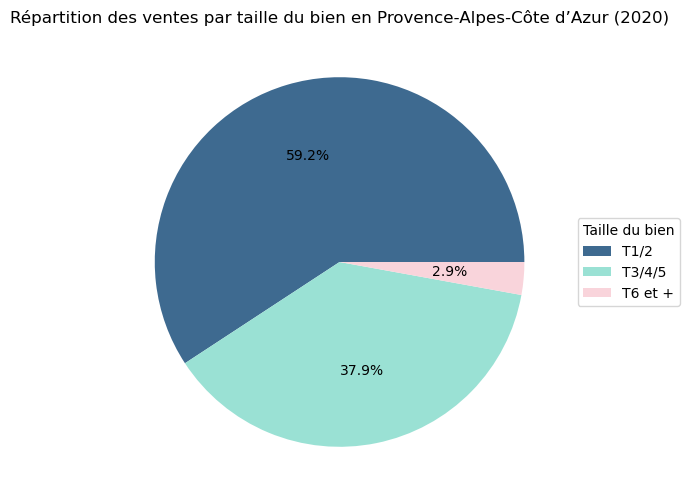

      Valeur fonciere                    
                count      mean    median
Année                                    
2017            82506  443318.0  220000.0
2018           155657  398693.0  210000.0
2019           170462  416866.0  215000.0
2020           171073  409335.0  232000.0
2021           197815  456808.0  264500.0
2022           166694  524860.0  282000.0


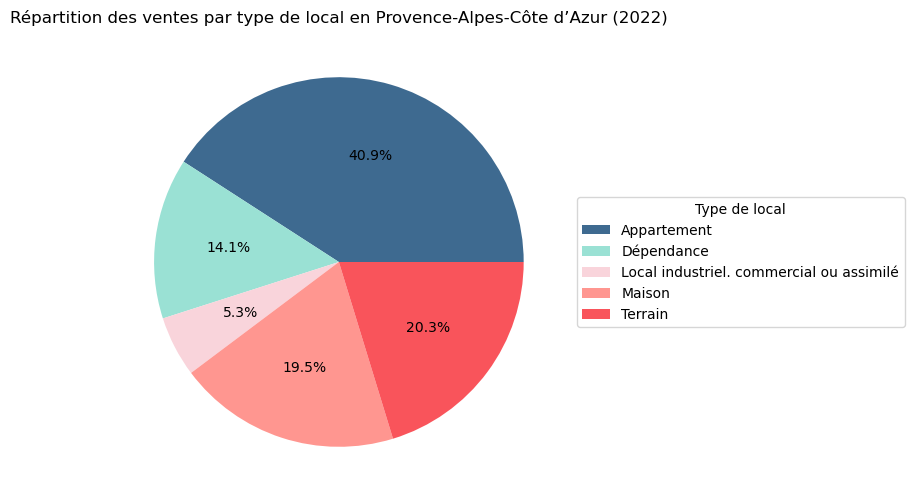

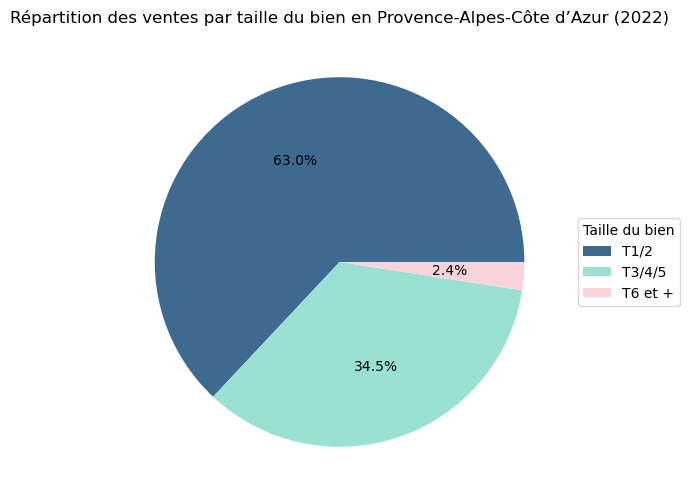

In [81]:
etude_regionale("Provence-Alpes-Côte d’Azur",'2020')
etude_regionale("Provence-Alpes-Côte d’Azur",'2022')

La fonction *etude_regionale* nous permet d'étudier annuellement les ventes par région.

Pour rappel, nous avions regardé précédemment les impacts de la crise sanitaire sur certaines régions, nous pouvons maintenant analyser plus en détail lesdits impacts.

- Bretagne : pour rappel, les prix bretons sont en constantes augmentations avec une tendance haussière pour les volumes des ventes. Le profil des biens vendus en Bretagne suit celui des biens vendus en France : 75% de T1/T2 en 2022 et le type des biens vendus corresponds également à celui de la France métropolitaine.

- Centre-Val de Loire : les changements dans la structure des biens vendus suivent ceux du niveau national : hausse importante des ventes de dépendances et même proprotion des biens vendus en fonction de leur taille.

- Guadeloupe : le nombre de transactions en Guadeloupe a diminué suite à la crise sanitaire, et le profil des ventes égalements : la majorité des ventes en 2022 étaient des biens d'habitation (plus de 50% des transactions, contre une moyenne nationale de 33% au niveau national. La part des biens vendus reste en revanche stable dans le temps avec des ventes d'environ 25% de terrains, 25% de maisons, et 25% d'appartements.

- Nouvelle Aquitaine : la grande majorité des transactions sont des terrains (55,2% en 2020, 49% en 2022) contre une moyenne nationale de 35%.

- Provence-Alpes-Côtes d'Azur :les changements dans la structure des biens vendus suivent ceux du niveau national : hausse importante des ventes de dépendances (mais dans des proportions plus élevées qu'au niveau national) et même proprotion des biens vendus en fonction de leur taille.

Malgré quelques changements, nous remarquons que les types de biens vendus n'ont pas particulièrement changé avec la crise sanitaire. Cependant, dans leur majorité la valeur foncière des biens est en hausse.  
Cette hausse des prix est imputable à une hausse très importante de la demande suite à la crise sanitaire. En effet, une partie des acheteurs a delayée l'achat ou la vente de leur bien à cause de la crise. A la fin de la crise, le marché de l'immobilier a donc continué à plein régime.  
Cette hausse ext exacerbée en 2022 avec la hausse des taux d'intérêts et les difficultées économiques liées à la guerre russo-ukrainienne.

#### Au niveau départemental

In [ ]:
def etude_departement(dep,an):
    # Récupération des données de la région
    df_dep = data.loc[data['Département'] == dep]
    
    # Récupération du nombre de biens vendus par type
    dep_type = df_dep.groupby(['Type local', 'Année'])['Type local'].count().unstack()
    
    # Récupération des données - nombre de logements vendus par ans en fonction du nombre de pièces principales
    nb_piece = pd.DataFrame()

    for annee in dep_type.columns:
        data_t1_t2 = df_dep[(df_dep['Nombre pieces principales'] <= 2) & (df_dep['Année'] == annee)]
        data_t3_t5 = df_dep[(df_dep['Nombre pieces principales'] >= 3) & (df_dep['Nombre pieces principales'] <= 5) & (df_dep['Année'] == annee)]
        data_plus_de_5_pieces = df_dep[(df_dep['Nombre pieces principales'] > 5) & (df_dep['Année'] == annee)]

        nb_piece[annee] = [data_t1_t2['Année'].count(),data_t3_t5['Année'].count(),data_plus_de_5_pieces['Année'].count()]

    nb_piece.index = ['T1/2','T3/4/5','T6 et +']
    
    #  Rappel des valeurs de la moyenne et de la médiane de la valeur foncière des biens
    print(round(df_dep[["Valeur fonciere","Année"]].groupby("Année").agg(["count","mean","median"]),0))
    
    # Diagramme du nombre de biens vendus par ans, en fonction de leur type
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(dep_type[an],autopct='%1.1f%%',colors=colors)
    ax.set_title(f'Répartition des ventes par type de local en {dep} ({an})')

    ax.legend(dep_type.index,
              title ="Type de local",
              loc ="center left",
              bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()
    
    # Diagramme - Nombre de biens vendus dans l'année en fonction du nombre de pièces principales
    fig, ax = plt.subplots(figsize=(12,6))
    plt.pie(nb_piece[an],autopct='%1.1f%%',colors=colors2)
    ax.set_title(f'Répartition des ventes par taille du bien en {dep} ({an})')

    ax.legend(nb_piece.index,
                title ="Taille du bien",
                loc ="center left",
                bbox_to_anchor =(1, 0, 0.5, 1))

    plt.show()

In [ ]:
etude_departement('Vosges','2020')
etude_departement('Vosges','2022')

La fonction ci-dessus permet d'analyser, par an et par département, les caractéristiques des ventes de bien dans un département français particulier.

Nous avons ici pris l'exemple des Vosges, un département dont le nombre de transaction et la valeur des biens est en augmentation depuis la fin de la crise sanitaire. Ainsi, nous pouvons voir que la proportion de terrains vendus a diminué de 10% entre 2020 et 2022, notamment au profit de la vente de dépendances.  
Ce changement de proporion est similaire au variation au niveau national.

### Analyse des prix de l'immobilier en fonction du nombre de pièces principales

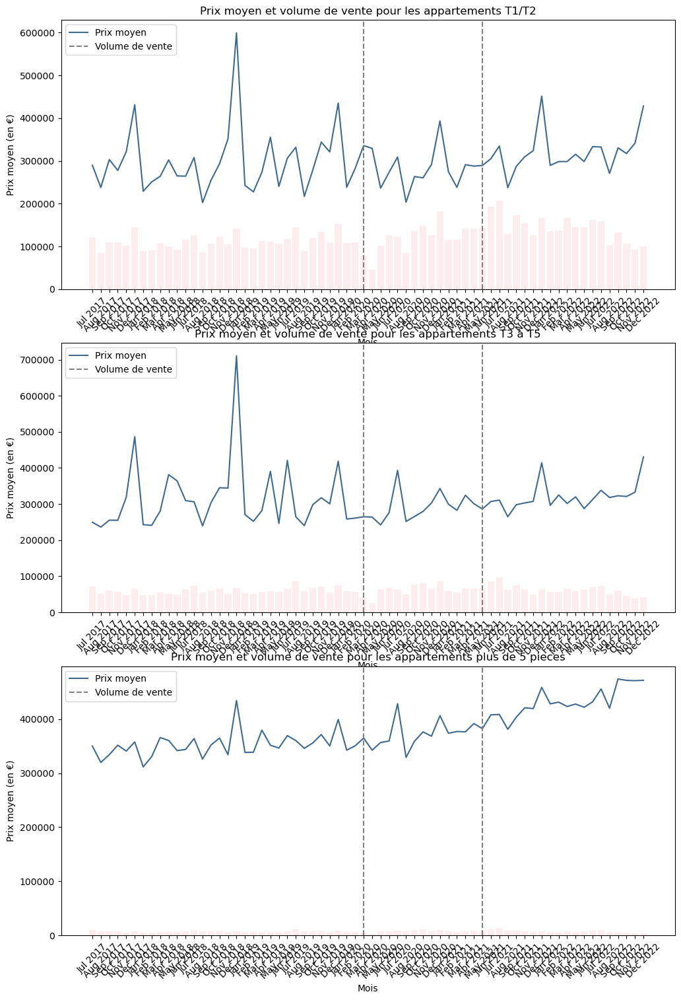

In [86]:
# Filtrer les données pour les appartements T1/T2, T3 à T5, et ceux supérieurs à 5 pièces
categories = ['T1/T2', 'T3 à T5', 'plus de 5 pieces']
data_categories = [data[data['Nombre pieces principales'] <= 2],
                   data[(data['Nombre pieces principales'] >= 3) & (data['Nombre pieces principales'] <= 5)],
                   data[data['Nombre pieces principales'] > 5]]

# Calculer le prix moyen et le volume de vente par mois pour chaque catégorie de nombre de pièces
prix_moyen_mois = []
volumes_vente_mois = []
for category_data in data_categories:
    prix_moyen_mois.append(category_data.groupby('Mois')['Valeur fonciere'].mean())
    volumes_vente_mois.append(category_data.groupby('Mois')['Valeur fonciere'].count())

# Convertir l'index en chaînes de caractères formatées
x_ticks = prix_moyen_mois[0].index.strftime('%b %Y')

# Créer une liste de positions pour les étiquettes sur l'axe x
x_tick_pos = np.arange(len(x_ticks))

# Créer les graphiques
fig, axs = plt.subplots(nrows=len(categories), figsize=(12, 6*len(categories)))

# Boucle sur chaque catégorie
for i, category in enumerate(categories):
    # Graphique pour la catégorie en cours
    axs[i].plot(x_tick_pos, prix_moyen_mois[i].values,color='#3e6a90')
    axs[i].bar(x_tick_pos, volumes_vente_mois[i], alpha=0.1,color='#f9545b')
    axs[i].set_title(f'Prix moyen et volume de vente pour les appartements {category}')
    axs[i].set_xlabel('Mois')
    axs[i].set_xticks(x_tick_pos)
    axs[i].set_xticklabels(x_ticks, rotation=45)
    axs[i].set_ylabel("Prix moyen (en €)")
    axs[i].axvline(x=np.where(x_ticks=='Mar 2020')[0], color='gray', linestyle='--')
    axs[i].axvline(x=np.where(x_ticks=='May 2021')[0], color='gray', linestyle='--')
    axs[i].legend(['Prix moyen', 'Volume de vente'], loc='upper left')

plt.show()

Nous pouvons voir que dans leur grande majorité les transactions se réalise pour des biens ayant une à deux pièces principales (cf. volume des ventes en rose).
Graphiquement, la crise sanitaire ne semble pas avoir eu un impact particulier sur le prix moyen des biens vendus. Nous remarquons juste une hausse des prix depuis mai 2021 pour les appartements de plus de 5 pièces principales. Cependant, nous ne pouvons rien en conclure à cause du epu de transactions.

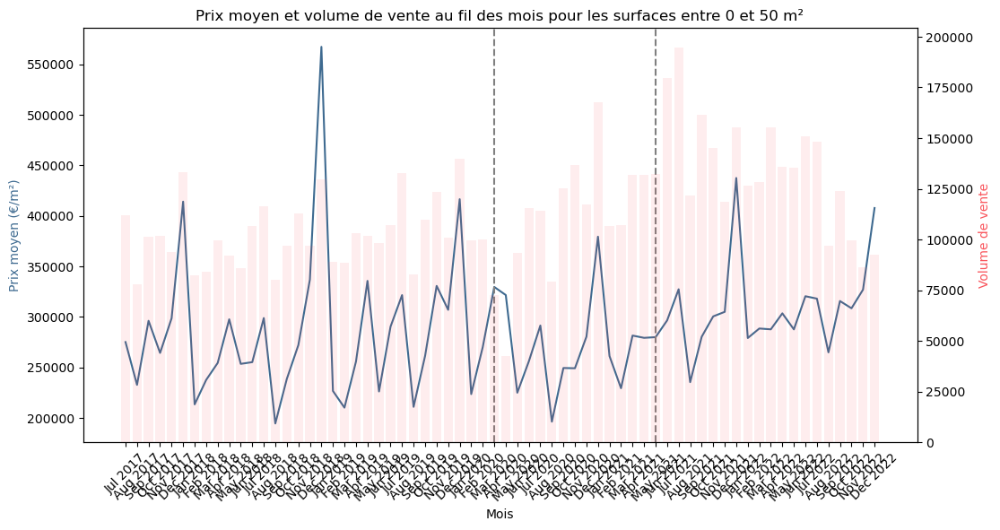

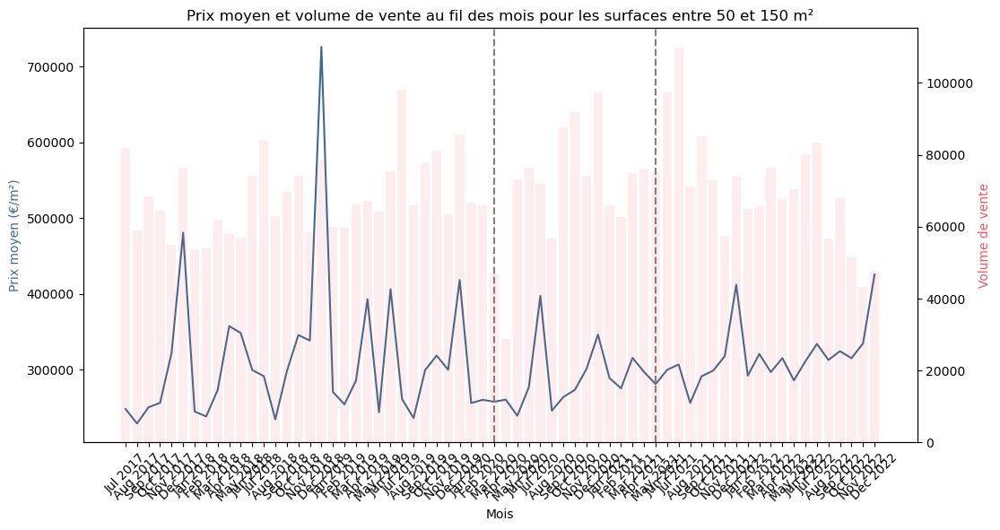

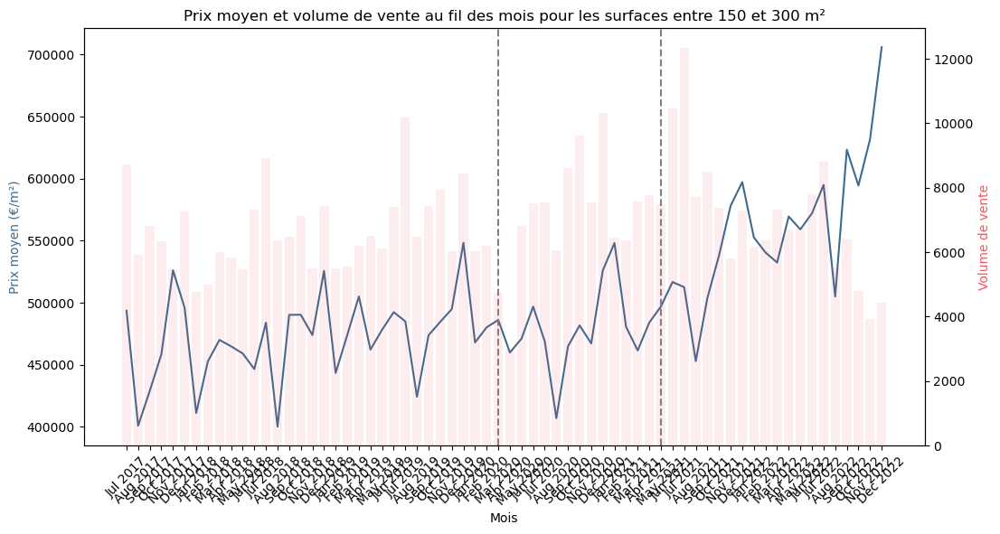

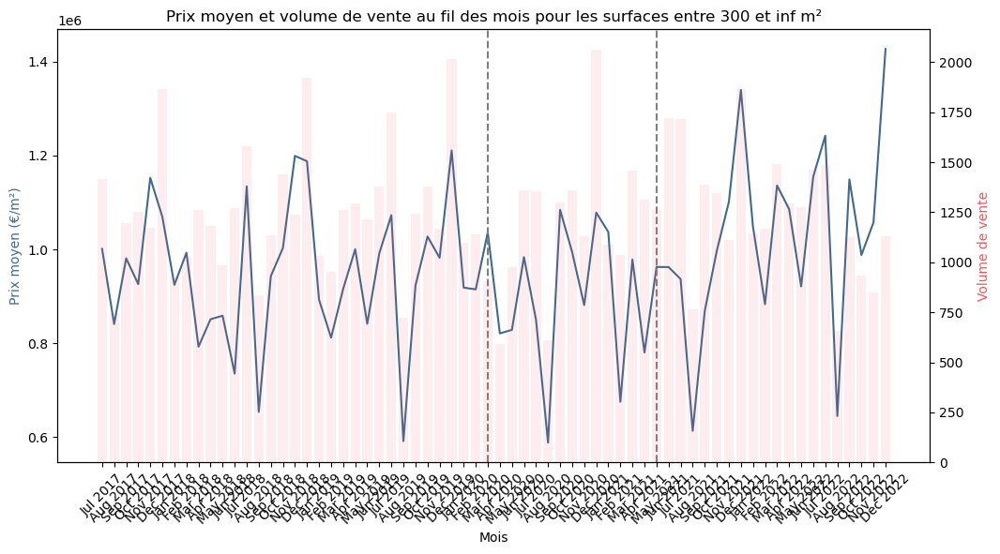

In [87]:
# Définir les plages de surface
surfaces = [(0, 50), (50, 150), (150, 300), (300, float('inf'))]

# Créer les graphiques pour chaque plage de surface
for i, (s_min, s_max) in enumerate(surfaces):
    # Filtrer les données pour la plage de surface courante
    data_surf = data[(data['Surface reelle bati'] >= s_min) & (data['Surface reelle bati'] < s_max)]
    
    # Calculer le prix moyen et le volume de vente par mois pour la plage de surface courante
    prix_moyen_mois_surf = data_surf.groupby('Mois')['Valeur fonciere'].mean()
    volume_vente_mois_surf = data_surf.groupby('Mois')['Valeur fonciere'].count()

    # Convertir l'index en chaînes de caractères formatées
    x_ticks_surf = prix_moyen_mois_surf.index.strftime('%b %Y')
    
    # Créer une liste de positions pour les étiquettes sur l'axe x
    x_tick_pos_surf = np.arange(len(prix_moyen_mois_surf))

    # Créer le graphique pour la plage de surface courante
    fig, ax1 = plt.subplots(figsize=(12, 6))
    ax1.plot(x_tick_pos_surf, prix_moyen_mois_surf.values, color='#3e6a90')
    ax1.set_title(f'Prix moyen et volume de vente au fil des mois pour les surfaces entre {s_min} et {s_max} m²')
    ax1.set_xlabel('Mois')
    ax1.set_ylabel('Prix moyen (€/m²)', color='#3e6a90')
    ax1.set_xticks(x_tick_pos_surf)
    ax1.set_xticklabels(x_ticks_surf, rotation=45)
    ax1.axvline(x=np.where(x_ticks_surf=='Mar 2020')[0], color='gray', linestyle='--')
    ax1.axvline(x=np.where(x_ticks_surf=='May 2021')[0], color='gray', linestyle='--')
    
    ax2 = ax1.twinx()
    ax2.bar(x_tick_pos_surf, volume_vente_mois_surf.values, color='#f9545b', alpha=0.1)
    ax2.set_ylabel('Volume de vente', color='#f9545b')

    plt.show()

Dans chaque cas, les prix des biens est très volatile d'un mois sur l'autre. Nous pensons donc qu'il existe un facteur de saisonnalité dans la détermination des prix de biens.

Cette forte volatilité nous empêche d'être conclusif sur l'impact de la crise sanitaire sur la valeur foncière des biens, excepté dans le cas des biens ayant une surface entre 150 et 300 m², dont la valeur est en très forte augmentation depuis la fin de la crise sanitaire.

### Conclusion

En conclusion, la crise sanitaire n'a pas eut d'impact particulier sur les prix de l'immobilier français en général. Nous avons néanmoins pu constater que l'impact de la crise sanitaire n'est pas homogène sur l'ensemble du territoire avec certains territoires qui sont bien impactés que d'autre, que ce soit en termes de transaction ou de valeur foncière des biens.

Nous pensons donc que d'autres variables, qui ne sont pas présentes dans notre étude influencent les prix de l'immobilier tels que les taux d'intérêts, les anticipations d'inflation des agents, et les effets de popularité d'une localisation ou d'un type de bien particulier (par exemple, une piscine augmente le prix d'un bien, mais ce n'est pas mesuré ici).

## 5 - Modèle prédictif des prix de l'immobilier

Il existe plusieurs manières de créer un modèle prédictif mais nous avons tenté une manière assez simple en utilisant un modèle linéaire. Nous allons appliquer ce que l'on a appris en économétrie avec les données en coupe instantanée, même si la meilleure manière de faire serait de prendre une série temporelle. Cependant pour celle-ci nous avons uniquement vu des séries temporelles à stationnariser pour ensuite trouver un modèle ARMA. Cela voudrait dire que l'information du prix se trouve en "elle-même" et que l'on pourrait faire abstraction des variables exogènes, ce qui ne peut pas être le cas ici.

Donc nous allons grossir au fur et à mesure le nombre de variable explicative jusqu'à arriver à un modèle convenable. Afin de tester notre modèle nous allons l'entrainer sur 90% de la base et la tester sur les 10% restants.

Autre information, pour notre régression linéaire sur prix sur nos variables nous allons avoir besoins de variable indicatrice pour nos colonnes non numérique comme le type de local ou les régions. Ceci va se traduire par la création d'autant de colonne qu'il n'y a de type de local et donc les valeurs prises par nos lignes seront 1 ou 0. 

Avant tout nous pensons ajouter comme variable l'année ainsi que le trimestre.

### Premier modèle

In [43]:
data_mod = data

# Extraction de l'année et du trimestre de la date de vente
data_mod['Annee'] = data_mod['Date'].dt.year
data_mod['Trimestre'] = data_mod['Date'].dt.quarter

C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\3885058743.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_mod['Annee'] = data_mod['Date'].dt.year
C:\Users\bossd\AppData\Local\Temp\ipykernel_21180\3885058743.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_mod['Trimestre'] = data_mod['Date'].dt.quarter


In [44]:
data_mod.columns

Index(['Date', 'Nature mutation', 'Valeur fonciere', 'Code postal', 'Commune',
       'Code departement', 'Type local', 'Surface reelle bati',
       'Nombre pieces principales', 'Surface terrain', 'Région', 'Département',
       'Surface totale', 'Année', 'Mois', 'Annee', 'Trimestre'],
      dtype='object')

In [45]:
# Suppression les colonnes non-utilisées dans la régression
data_mod = data.drop(columns=['Date', 'Nature mutation', 'Code postal', 'Commune', 'Code departement', 'Département', 'Mois', 'Année'])

In [46]:
# Sélection des colonnes numériques pour la régression dans un 1er temps
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain']]

# Colonne endogène à expliquer
y = data_mod['Valeur fonciere']

# Ajout d'une constante pour le terme d'interception
X = sm.add_constant(X)

# Création le modèle de régression linéaire et l'entraîner sur les données d'apprentissage
model = sm.OLS(y, X).fit()

# Afficher un résumé des résultats
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        Valeur fonciere   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                 2.634e+04
Date:                Fri, 21 Apr 2023   Prob (F-statistic):               0.00
Time:                        20:01:00   Log-Likelihood:            -2.7335e+08
No. Observations:            17946450   AIC:                         5.467e+08
Df Residuals:                17946446   BIC:                         5.467e+08
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

Pour notre premier essai, les résultats ne sont vraiment pas concluant avec un R² de 0.4%, ce qui signifie qu'avec nos 3 variables nous ne parvenons qu'à expliquer 0.4% du prix ce qui est clairement insuffisant.

Pour l'instant nous n'avons utiliser que des variables numériques. Nous allons tenter d'introduire comme première variable indicatrice le type de local.

In [47]:
# Sélectionner les colonnes numériques pour la régression dans un 1er temps
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Type local']]
# Transformer les colonnes catégorielles en variables binaires
X = pd.get_dummies(X, columns=['Type local'])

In [48]:
X.columns

Index(['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain',
       'Type local_Appartement', 'Type local_Dépendance',
       'Type local_Local industriel. commercial ou assimilé',
       'Type local_Maison', 'Type local_Terrain'],
      dtype='object')

Ainsi nous voyons que chaque type de local est désormais une colonne dont la valeur est 1 (si le bien correspond à la colonne) ou 0 (sinon)

In [49]:
# Ajouter une constante pour le terme d'interception
#X = sm.add_constant(X)

# Créer le modèle de régression linéaire et l'entraîner sur les données d'apprentissage
model = sm.OLS(y,X).fit()

# Afficher un résumé des résultats
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        Valeur fonciere   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                 7.531e+04
Date:                Tue, 18 Apr 2023   Prob (F-statistic):               0.00
Time:                        20:15:39   Log-Likelihood:            -2.7313e+08
No. Observations:            17946450   AIC:                         5.463e+08
Df Residuals:                17946442   BIC:                         5.463e+08
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

Nous avons grandement augmenter notre R² qui est désormais à 2,9%. Ceci était attendu car nous avons grandement augmenter le nombre de variable exogène. Ajoutons maintenant comme variable la région.

In [50]:
# Sélectionner les colonnes numériques pour la régression dans un 1er temps
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Région','Type local']]
# Transformer les colonnes catégorielles en variables binaires
X = pd.get_dummies(X, columns=['Région','Type local'])

In [51]:
# Créer le modèle de régression linéaire et l'entraîner sur les données d'apprentissage
#model = sm.OLS(y,X).fit()

# Afficher un résumé des résultats
#print(model.summary())

C:\Users\gabri\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1934: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])


                            OLS Regression Results                            
Dep. Variable:        Valeur fonciere   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Tue, 18 Apr 2023   Prob (F-statistic):                nan
Time:                        20:20:16   Log-Likelihood:                    nan
No. Observations:            17946450   AIC:                               nan
Df Residuals:                17946450   BIC:                               nan
Df Model:                          -1                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

Malheureusement, cette régréssion demande trop de ressources, nous n'avons donc aucun résultat.

Nous nous apercevons aussi qu'il y a un problème de colinéarité de nos variables. La multicollinéarité entre nos variables existe quand elles sont corrélées. Cela pose des problèmes dans les analyses statistiques car elle fausse l'interprétation des coefficients de régression et la sélection des variables les plus importantes pour le modèle.

### Corrélation des variables

Faisons une analyses de corrélation pour notre premier modèle.

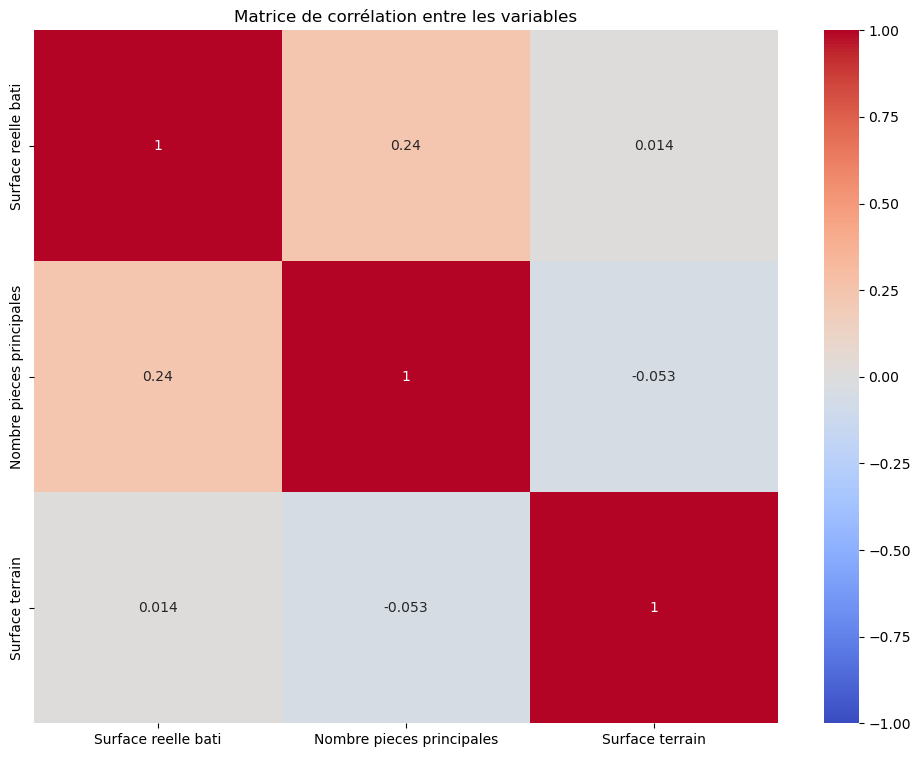

In [98]:
# Sélection des colonnes pour la régression
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain']]

# Création des variables binaires pour 'Type local'
#X = pd.get_dummies(X, columns=['Type local'])

# Calcul de la matrice de corrélation
correlation_matrix = X.corr()

# Affichage de la matrice de corrélation avec un heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Matrice de corrélation entre les variables")
plt.show()

Ici il ne semble pas avoir de grosse corrélation entre nos variables ici, ce qui indique que notre modèle peut être interprétable même s'il explique très mal le prix 

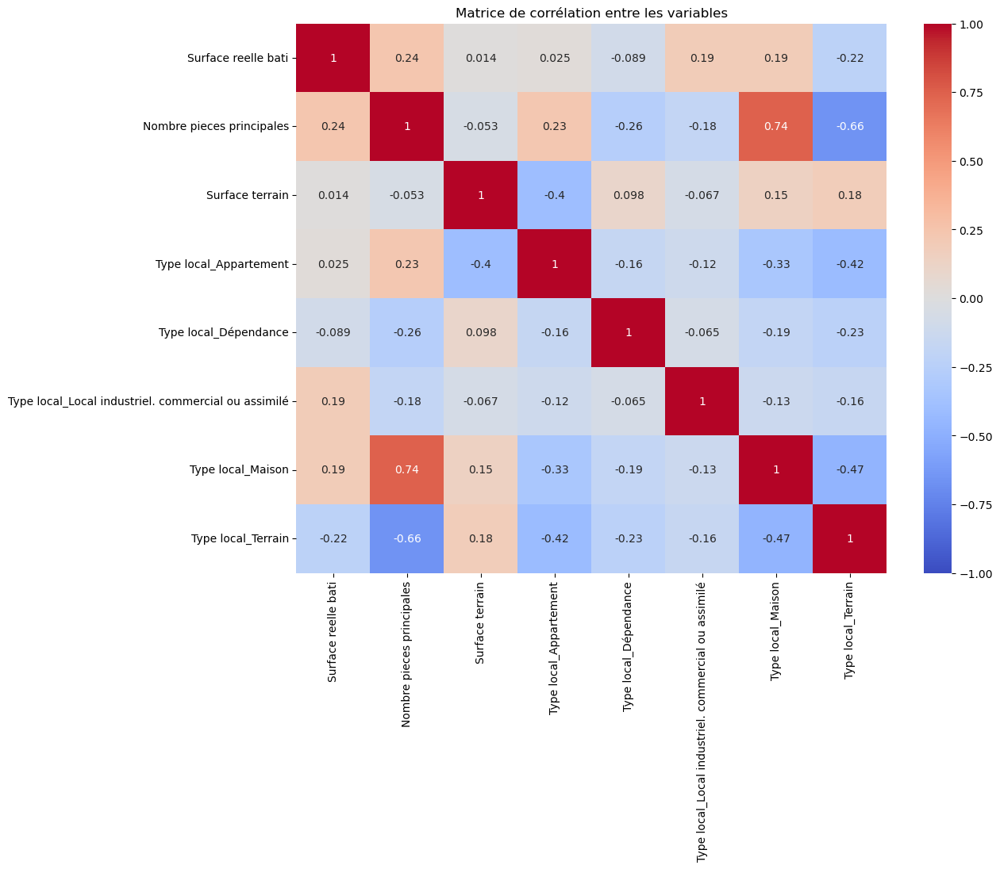

In [99]:
# Sélection des colonnes pour la régression
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Type local']]

# Création des variables binaires pour 'Type local'
X = pd.get_dummies(X, columns=['Type local'])

# Calcul de la matrice de corrélation
correlation_matrix = X.corr()

# Affichage de la matrice de corrélation avec un heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Matrice de corrélation entre les variables")
plt.show()

Nous avons ici de très grosse corrélation entre plusieurs de nos variable (|x|>0.5, par exemple dans cas du nombre de pièces principales  et des maisons / terrains), ceci va donc complexifier la compréhension de notre modèle. Nous préfèrerons ne pas le retenir.

Nous allons essayer la même chose avec les régions à la place des types de locaux.

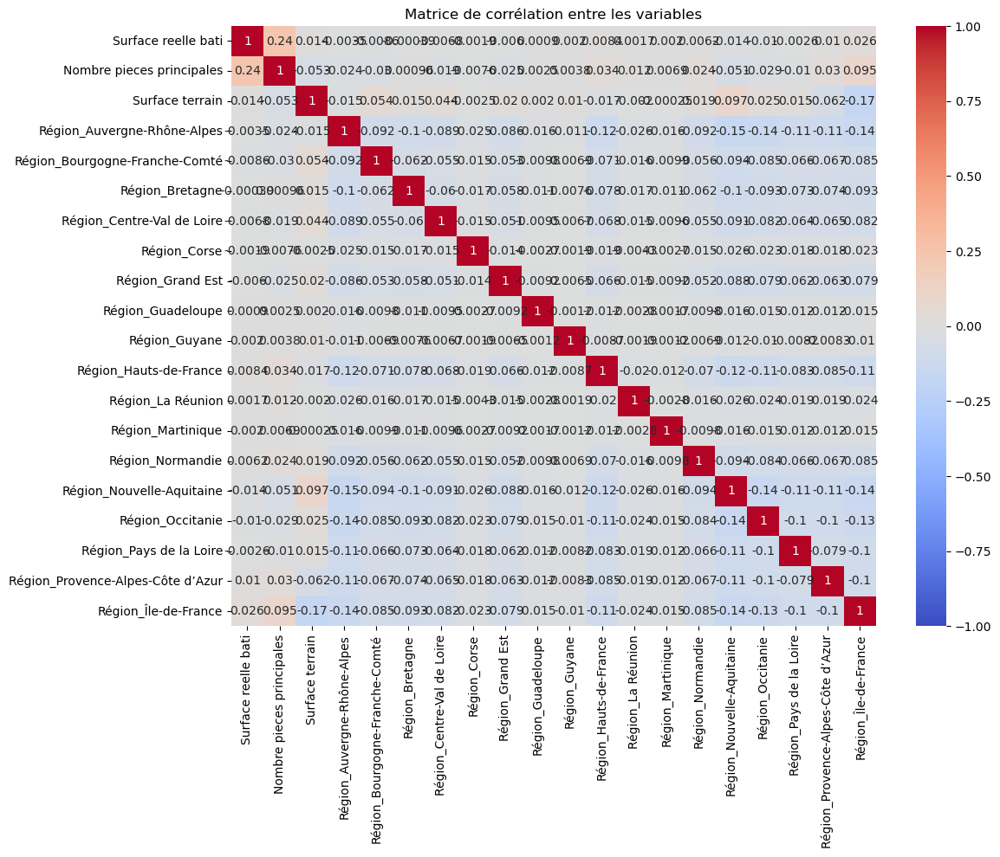

In [100]:
# Sélection des colonnes pour la régression
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Région']]

# Création des variables binaires pour 'Type local'
X = pd.get_dummies(X, columns=['Région'])

# Calcul de la matrice de corrélation
correlation_matrix = X.corr()

# Affichage de la matrice de corrélation avec un heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Matrice de corrélation entre les variables")
plt.show()

Ici il y a beaucoup plus de variables, peut-être même trop mais il n'y a pas de grosse corrélation entre nos variables.

Nous allons essayé ici un autre modèle avec comme variable indicatrice l'année et le trimestre de vente.

### Prise en compte de l'année de la vente

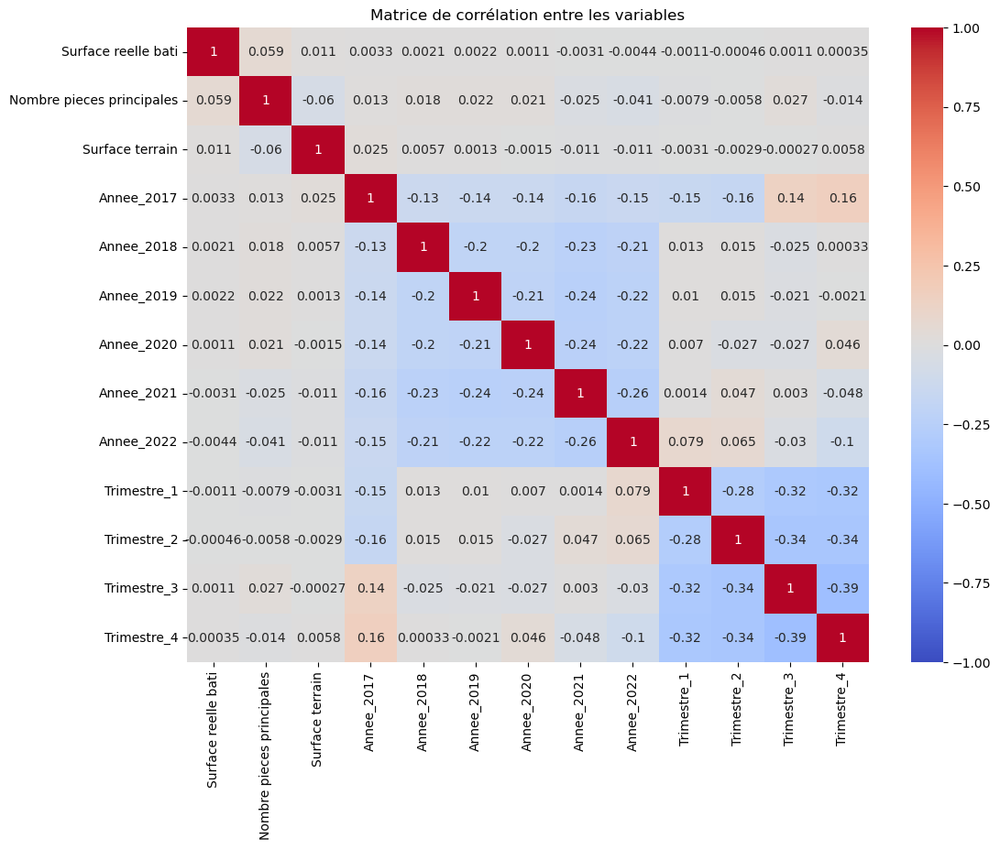

In [46]:
# Sélection des colonnes pour la régression
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Annee','Trimestre']]

# Création des variables binaires pour 'Type local'
X = pd.get_dummies(X, columns=['Annee','Trimestre'])

# Calcul de la matrice de corrélation
correlation_matrix = X.corr()

# Affichage de la matrice de corrélation avec un heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Matrice de corrélation entre les variables")
plt.show()

Nous avons quelques endroits où les corrélations sont plûtot fortes, entre les trimestres, nous allons donc les enlever pour garder uniquement les années.

Nous allons garder comme variable pour notre modèle à des fins de simplicité la surface bati et celle du terrain, le nombre de pièce et l'année de vente

In [49]:
# Sélection des colonnes pour la régression
X = data_mod[['Surface reelle bati', 'Nombre pieces principales', 'Surface terrain','Annee']]

# Création des variables binaires pour 'Type local'
X = pd.get_dummies(X, columns=['Annee'])

# Ajouter une constante pour le terme d'interception
X = sm.add_constant(X)

# Créer le modèle de régression linéaire et l'entraîner sur les données d'apprentissage
model = sm.OLS(y, X).fit()

# Afficher un résumé des résultats
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        Valeur fonciere   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                 1.044e+04
Date:                Tue, 18 Apr 2023   Prob (F-statistic):               0.00
Time:                        21:30:15   Log-Likelihood:            -2.7334e+08
No. Observations:            17946450   AIC:                         5.467e+08
Df Residuals:                17946441   BIC:                         5.467e+08
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

Ici notre R² est toujours très faible donc notre modèle explique très faiblement notre variable endogène mais toutes nos variables sont significatives.

Comme attendu les coefficient des surfaces et du nombre de pièces sont positives, en effet avoir une plus grande surface est censé augmenter le prix.
Aussi le coeffecient de la surface bâti est plus de 10 fois supérieur à celui de la surface du terrain ce qui nous parait aussi plausible. Un terrain construit vaut beaucoup plus qu'un terrain vierge.
Enfin au niveau des années nous voyons que l'année 2018-2019 ont été les années où l'immobilier étaient le plus chère donc juste avant le covid. L'année 2020 a d'ailleur un coeffcient divisé par 3 par rapport à 2019 mais nous voyons que le secteur se rétablie au cours de années 2021 puis 2022.